# Model: Decision Tree with three cross validation methods.

Holdout 20% method has considerable changes of training and test MSE due to the random nature of the split. In some versions both are very good sometimes bad. This problem does not arise to that extent for the K-10 folds method. The values are more stable and in the last version lower. Test MSE is lower than training MSE since it has less data and that is good for a flexible model like DTR.
The Loo method (laptop could not handle the data, so I used book instead of book1 here) has zero test MSE because the test set consists only of one observation.


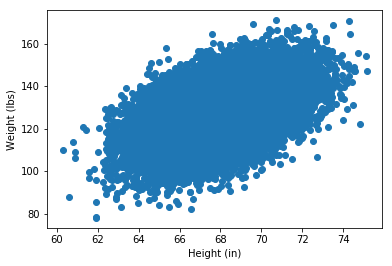

In [2]:
#predict weight with height
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import scipy.optimize as optimization
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor

#load data
data=pd.read_excel('Book1.xlsx')
mat1=data.as_matrix()
data=np.transpose(data.as_matrix())

#plot the data
x=data[1]
y=data[2]
plt.scatter(x,y)
plt.xlabel("Height (in)")
plt.ylabel("Weight (lbs)")
plt.show()

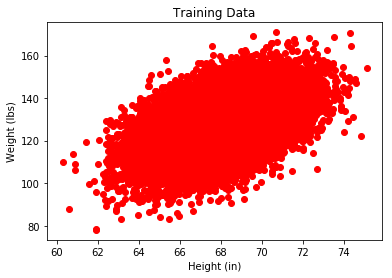

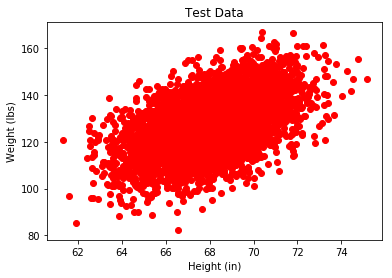

In [40]:
#holdout 20% method of the linear model validation
matr = np.arange(len(data[0]))
selection1 = np.random.permutation(matr)
num = int(0.8*len(data[0]))
selection = [selection1[i] for i in range(0,num)]
#print(selection)    

dataTrain = np.array([i for i in np.transpose(data) if i[0] in selection])
dataTest = np.array([i for i in np.transpose(data) if i[0] not in selection])
dataTrain = np.transpose(dataTrain)
dataTest = np.transpose(dataTest)

plt.title("Training Data")
plt.scatter(dataTrain[1],dataTrain[2], c='red')
plt.xlabel("Height (in)")
plt.ylabel("Weight (lbs)")
plt.show()

plt.title("Test Data")
plt.scatter(dataTest[1],dataTest[2], c='red')
plt.xlabel("Height (in)")
plt.ylabel("Weight (lbs)")
plt.show()

MSE: 104.88361242


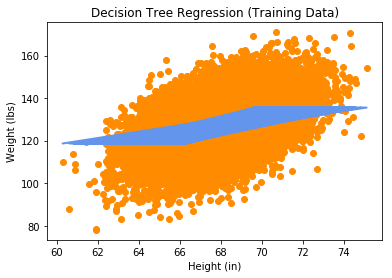

In [41]:
#Plot the data
x=dataTrain[1]
y=dataTrain[2]

z=x.reshape(-1,1)
tree_reg=DecisionTreeRegressor(max_depth=2)
tree_reg.fit(z,y)
tree_mse=mean_squared_error(y,tree_reg.predict(z))
print("MSE:",tree_mse)

# Predict
y_1 = tree_reg.fit(z,y).predict(z)

plt.figure()
plt.scatter(z, y, c="darkorange")
plt.plot(z, y_1, color="cornflowerblue", linewidth=2)
plt.xlabel("Height (in)")
plt.ylabel("Weight (lbs)")
plt.title('Decision Tree Regression (Training Data)')
plt.legend()
plt.show()

MSE: 104.147999828


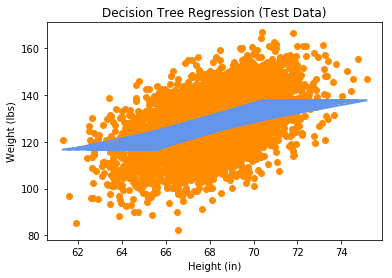

In [42]:
#Plot the data
x=dataTest[1]
y=dataTest[2]

z=x.reshape(-1,1)
tree_reg=DecisionTreeRegressor(max_depth=2)
tree_reg.fit(z,y)
tree_mse=mean_squared_error(y,tree_reg.predict(z))
print("MSE:",tree_mse)

# Predict
y_1 = tree_reg.fit(z,y).predict(z)

plt.figure()
plt.scatter(z, y, c="darkorange")
plt.plot(z, y_1, color="cornflowerblue", linewidth=2)
plt.xlabel("Height (in)")
plt.ylabel("Weight (lbs)")
plt.title('Decision Tree Regression (Test Data)')
plt.legend()
plt.show()

MSE: 104.676612137


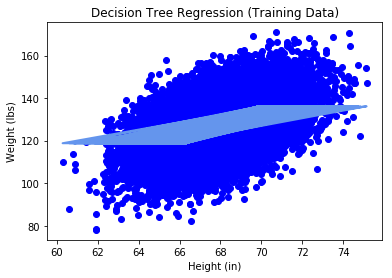

MSE: 104.837576423


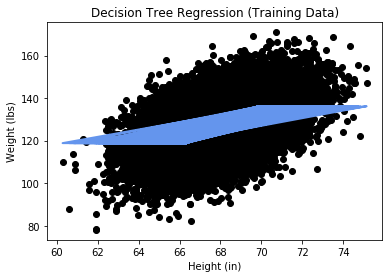

MSE: 105.44524626


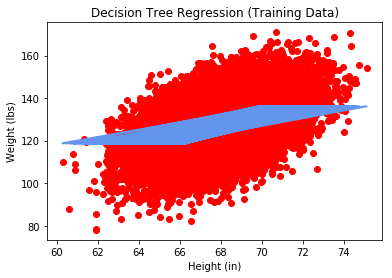

MSE: 105.129362243


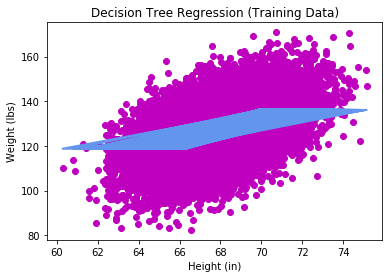

MSE: 105.140865336


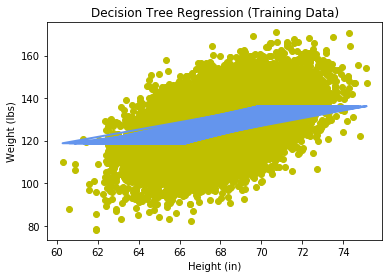

MSE: 104.703872763


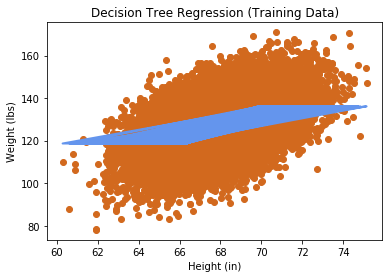

MSE: 104.727100029


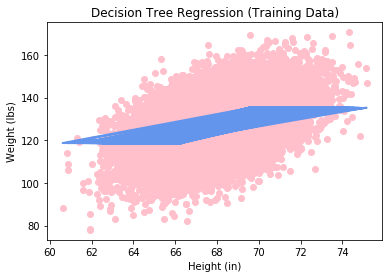

MSE: 105.521052447


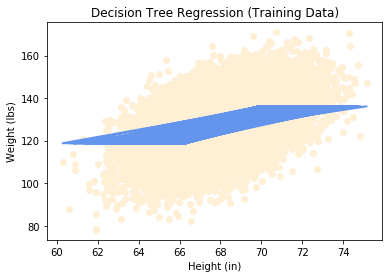

MSE: 105.001417889


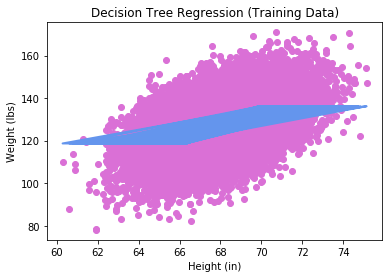

MSE: 105.310004981


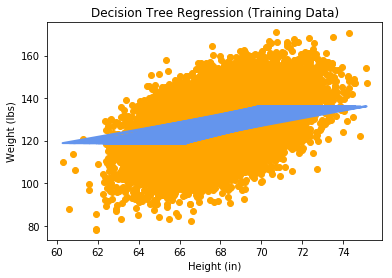

MSE: 106.439869408


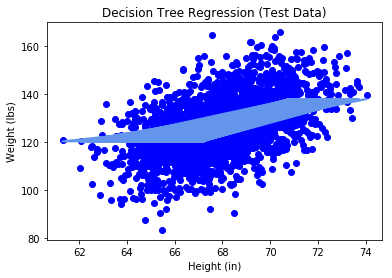

MSE: 106.154197263


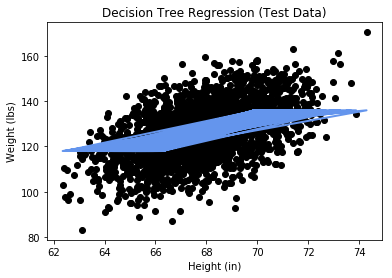

MSE: 100.471269183


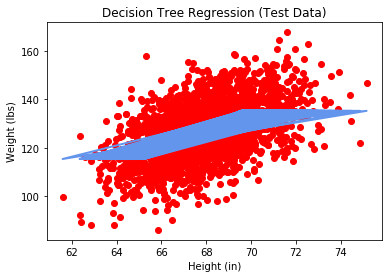

MSE: 103.84672636


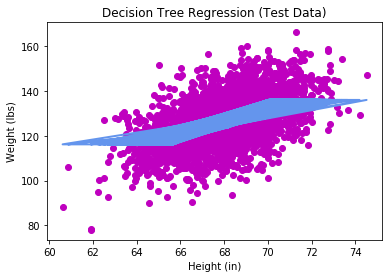

MSE: 102.706749521


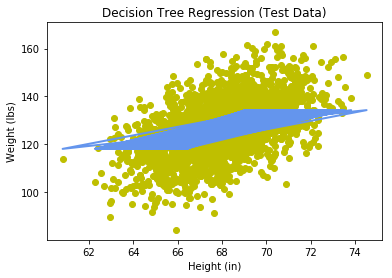

MSE: 107.013041075


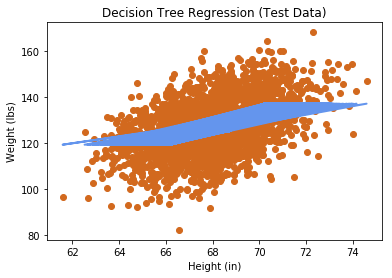

MSE: 105.881307816


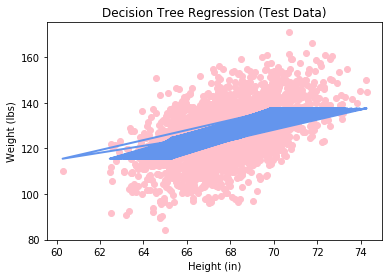

MSE: 98.8426482887


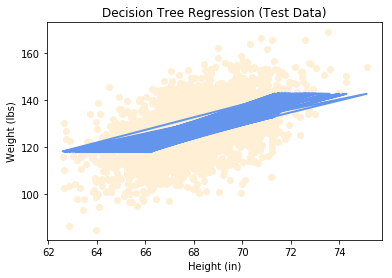

MSE: 102.708184899


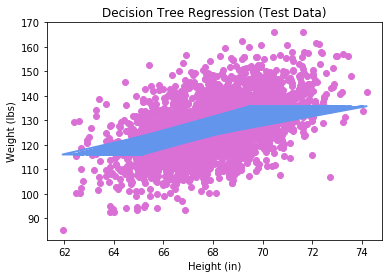

MSE: 101.528114894


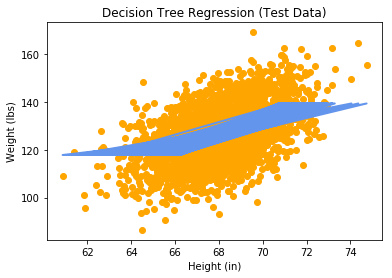

Average Training-MSE: 105.049311051
Average Test-MSE: 103.559210871


In [44]:
#K fold cross validation of the linear model for K=10
mat1=np.random.permutation(mat1)
spl=np.array_split(mat1,10)
test1=spl[0]
data1=np.vstack((spl[1],spl[2],spl[3],spl[4],spl[5],spl[6],spl[7],spl[8],spl[9]))
test2=spl[1]
data2=np.vstack((spl[0],spl[2],spl[3],spl[4],spl[5],spl[6],spl[7],spl[8],spl[9]))
test3=spl[2]
data3=np.vstack((spl[1],spl[0],spl[3],spl[4],spl[5],spl[6],spl[7],spl[8],spl[9]))
test4=spl[3]
data4=np.vstack((spl[1],spl[2],spl[0],spl[4],spl[5],spl[6],spl[7],spl[8],spl[9]))
test5=spl[4]
data5=np.vstack((spl[1],spl[2],spl[3],spl[0],spl[5],spl[6],spl[7],spl[8],spl[9]))
test6=spl[5]
data6=np.vstack((spl[1],spl[2],spl[3],spl[4],spl[0],spl[6],spl[7],spl[8],spl[9]))
test7=spl[6]
data7=np.vstack((spl[1],spl[2],spl[3],spl[4],spl[5],spl[0],spl[7],spl[8],spl[9]))
test8=spl[7]
data8=np.vstack((spl[1],spl[2],spl[3],spl[4],spl[5],spl[6],spl[0],spl[8],spl[9]))
test9=spl[8]
data9=np.vstack((spl[1],spl[2],spl[3],spl[4],spl[5],spl[6],spl[7],spl[0],spl[9]))
test10=spl[9]
data10=np.vstack((spl[1],spl[2],spl[3],spl[4],spl[5],spl[6],spl[7],spl[8],spl[0]))
crosstest=[test1,test2,test3,test4,test5,test6,test7,test8,test9,test10]
crossdata=[data1,data2,data3,data4,data5,data6,data7,data8,data9,data10]


#plot the data
a=np.zeros((10))
b=np.zeros((10))
err=np.zeros((10))
color=np.array(['b','k','r','m','y','chocolate', 'pink', 'papayawhip', 'orchid','orange'])
sum1=0
for m in range(10):
    x=crossdata[m][:,1]
    y=crossdata[m][:,2]

    z=x.reshape(-1,1)
    tree_reg=DecisionTreeRegressor(max_depth=2)
    tree_reg.fit(z,y)
    tree_mse=mean_squared_error(y,tree_reg.predict(z))
    y_1 = tree_reg.fit(z,y).predict(z)
    print("MSE:",tree_mse)
    sum1+= tree_mse
    plt.figure()
    plt.scatter(z, y, c=color[m])
    plt.plot(z, y_1, color="cornflowerblue", linewidth=2)
    plt.xlabel("Height (in)")
    plt.ylabel("Weight (lbs)")
    plt.title('Decision Tree Regression (Training Data)')
    plt.legend()
    plt.show()
sum2=0
#plot the data
for m in range(10):
    x=crosstest[m][:,1]
    y=crosstest[m][:,2]  

    z=x.reshape(-1,1)
    tree_reg=DecisionTreeRegressor(max_depth=2)
    tree_reg.fit(z,y)
    tree_mse1=mean_squared_error(y,tree_reg.predict(z))
    y_1 = tree_reg.fit(z,y).predict(z)
    print("MSE:",tree_mse1)
    sum2+= tree_mse1
    plt.figure()
    plt.scatter(z, y, c=color[m])
    plt.plot(z, y_1, color="cornflowerblue", linewidth=2)
    plt.xlabel("Height (in)")
    plt.ylabel("Weight (lbs)")
    plt.title('Decision Tree Regression (Test Data)')
    plt.legend()
    plt.show()
print("Average Training-MSE:",sum1/10)
print("Average Test-MSE:",sum2/10)

MSE: 105.292650224


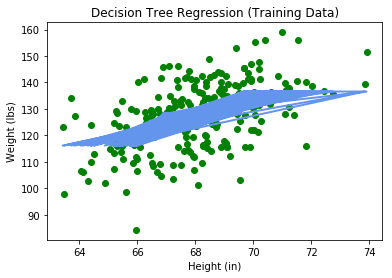

MSE: 105.292650224


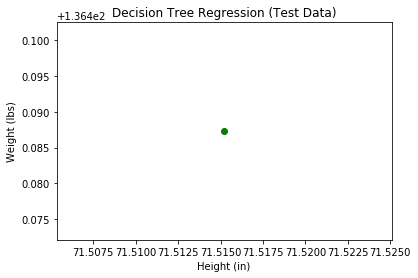

MSE: 102.801591327


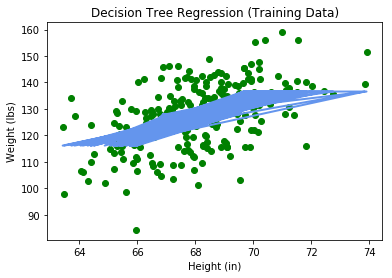

MSE: 102.801591327


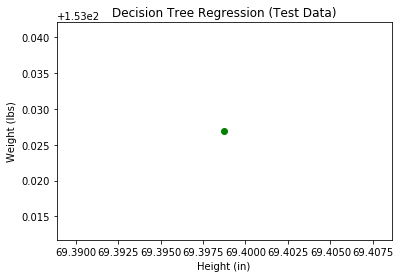

MSE: 104.488696919


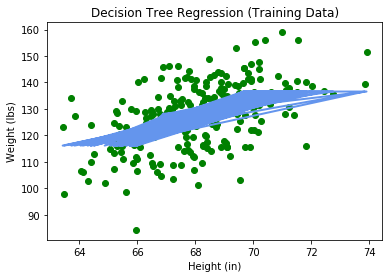

MSE: 104.488696919


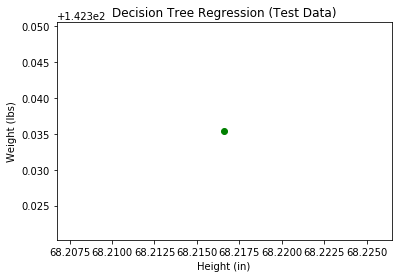

MSE: 104.248757896


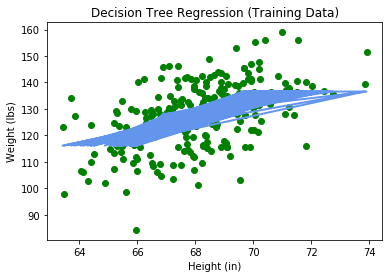

MSE: 104.248757896


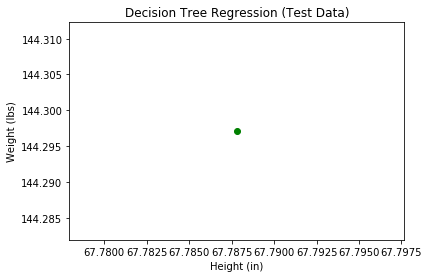

MSE: 105.192298835


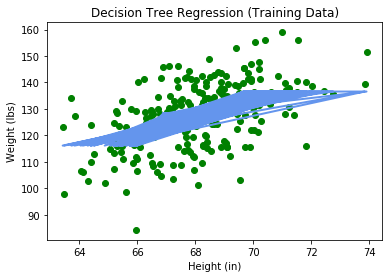

MSE: 105.192298835


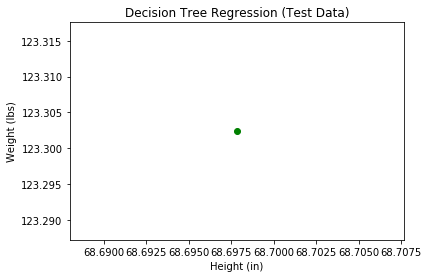

MSE: 105.193552479


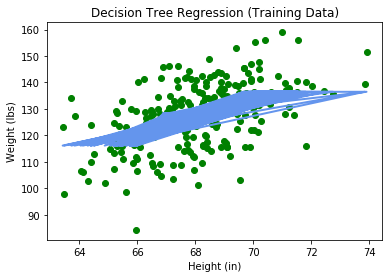

MSE: 105.193552479


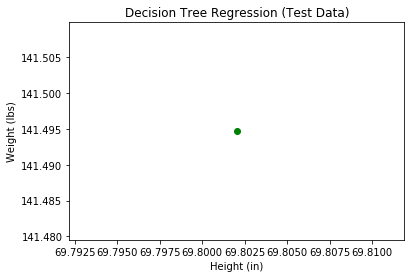

MSE: 105.292627735


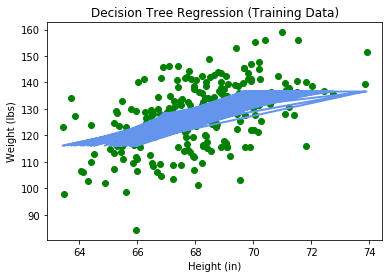

MSE: 105.292627735


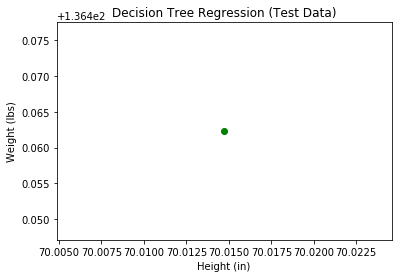

MSE: 104.265057503


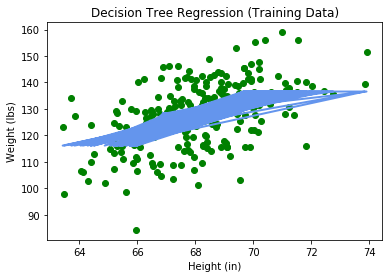

MSE: 104.265057503


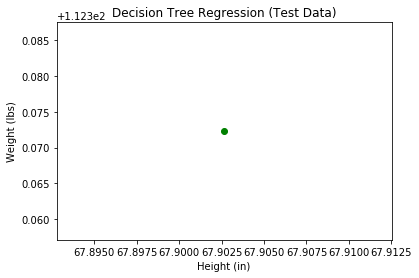

MSE: 105.274463109


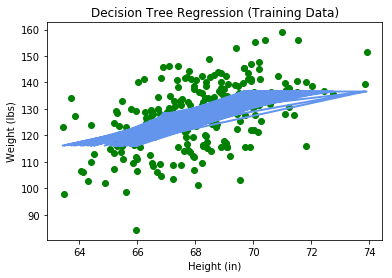

MSE: 105.274463109


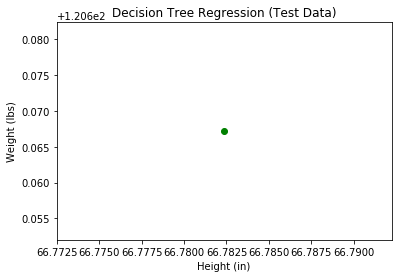

MSE: 105.200775582


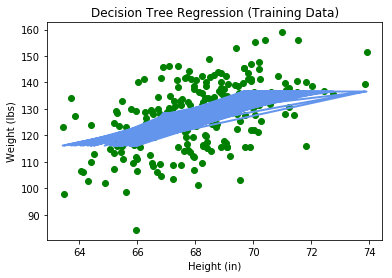

MSE: 105.200775582


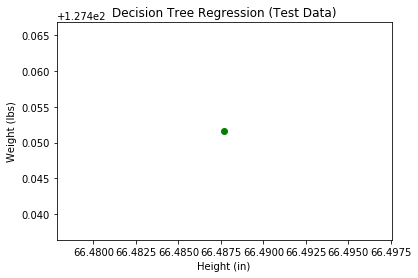

MSE: 104.481201681


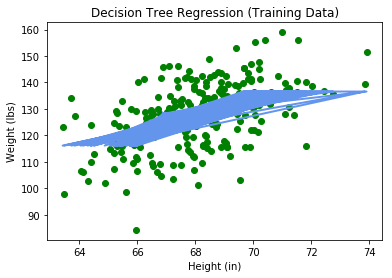

MSE: 104.481201681


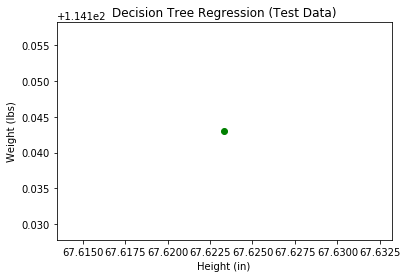

MSE: 105.263900251


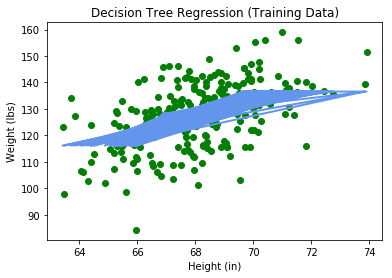

MSE: 105.263900251


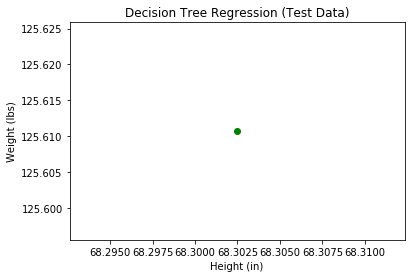

MSE: 105.155464147


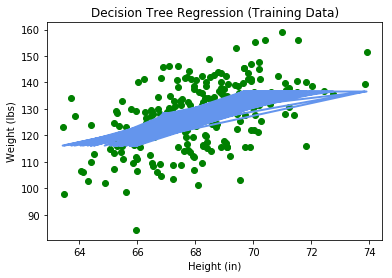

MSE: 105.155464147


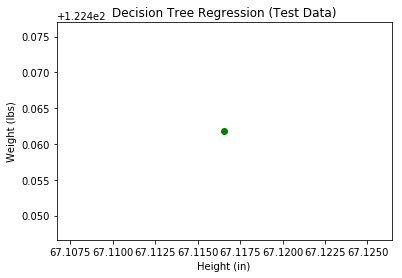

MSE: 104.689105268


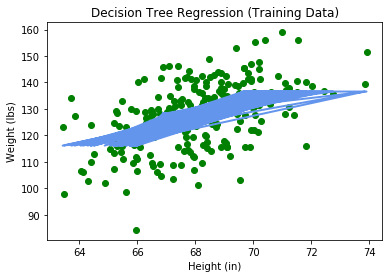

MSE: 104.689105268


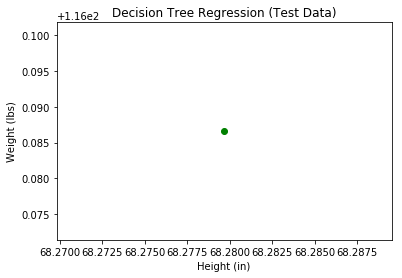

MSE: 105.244789391


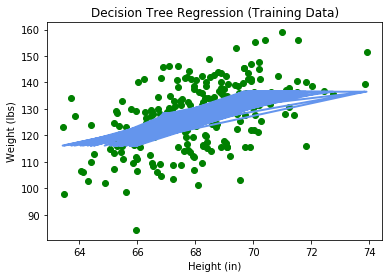

MSE: 105.244789391


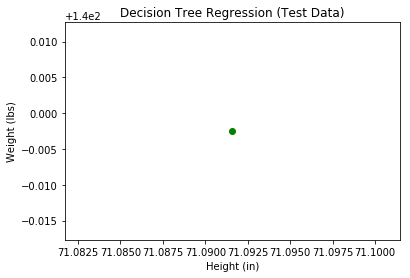

MSE: 105.102926055


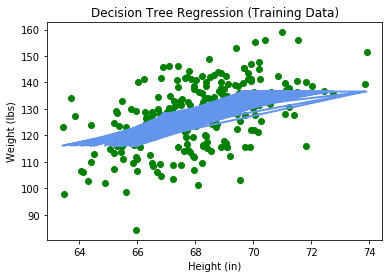

MSE: 105.102926055


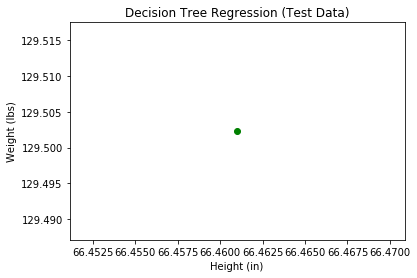

MSE: 104.414106965


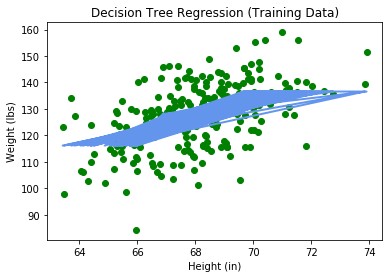

MSE: 104.414106965


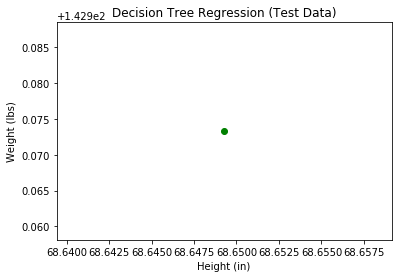

MSE: 105.2855437


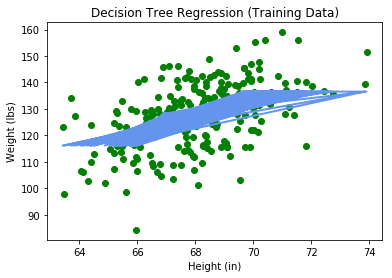

MSE: 105.2855437


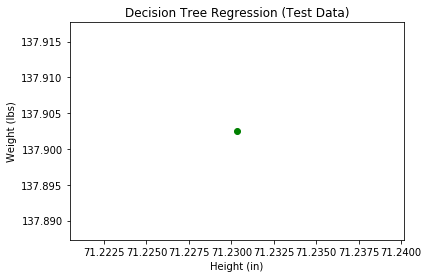

MSE: 105.220056568


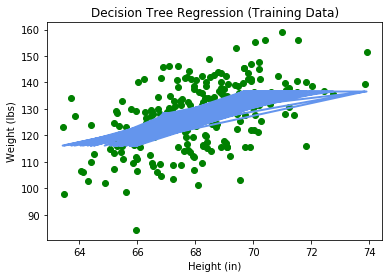

MSE: 105.220056568


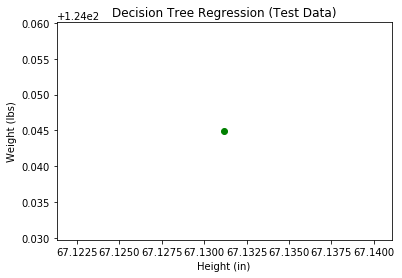

MSE: 104.604766647


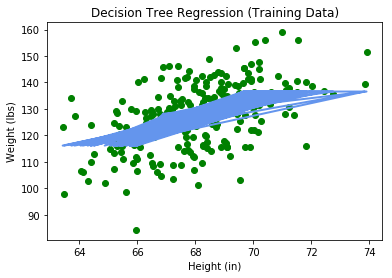

MSE: 104.604766647


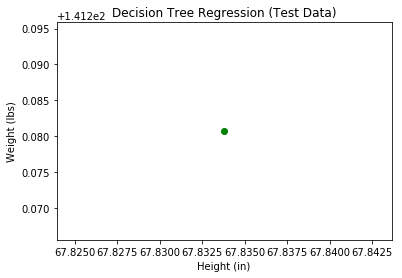

MSE: 104.345166776


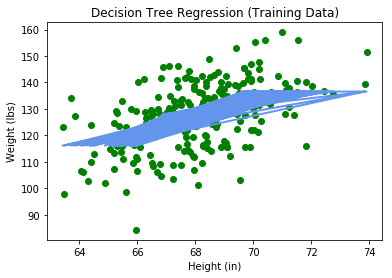

MSE: 104.345166776


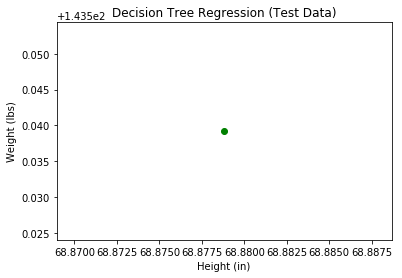

MSE: 103.912709156


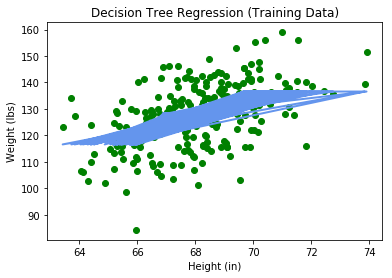

MSE: 103.912709156


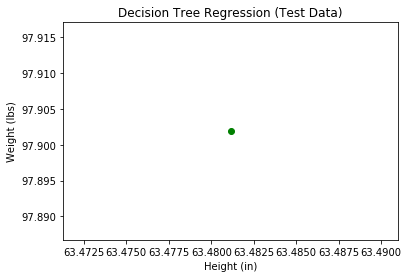

MSE: 105.286530833


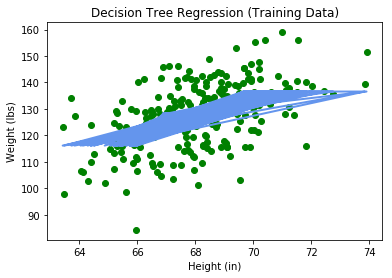

MSE: 105.286530833


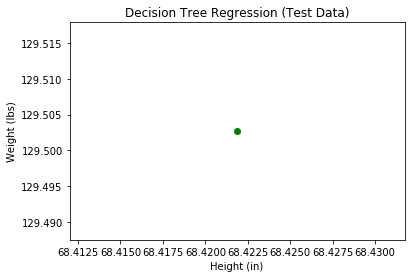

MSE: 104.543227472


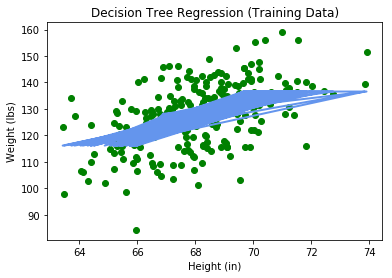

MSE: 104.543227472


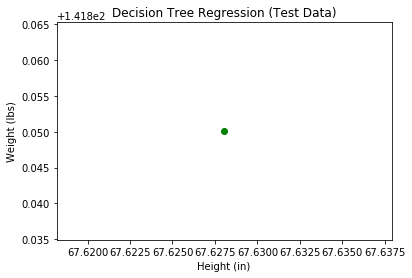

MSE: 105.284112592


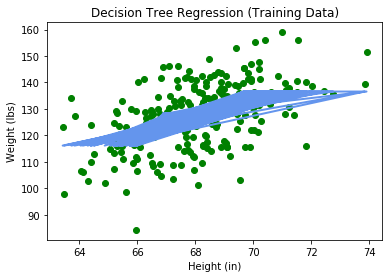

MSE: 105.284112592


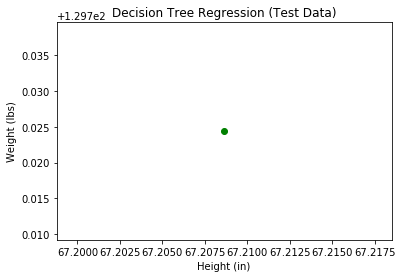

MSE: 105.152503338


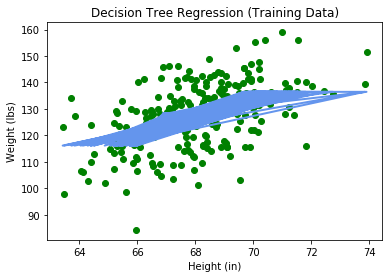

MSE: 105.152503338


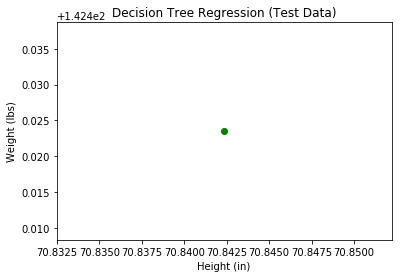

MSE: 105.249000837


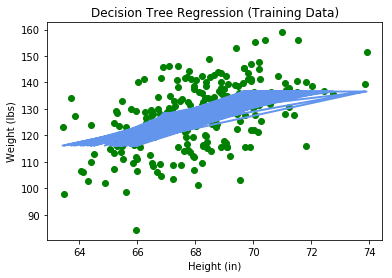

MSE: 105.249000837


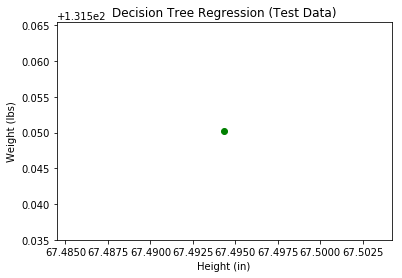

MSE: 104.424710985


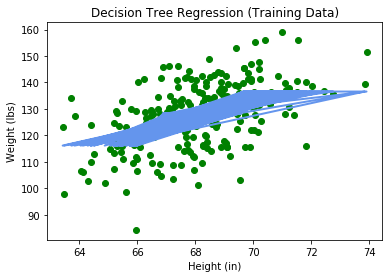

MSE: 104.424710985


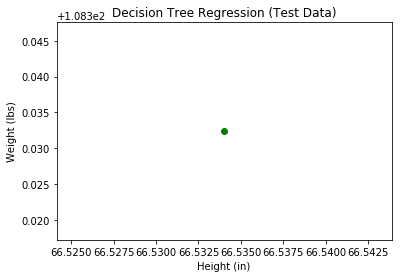

MSE: 105.270984429


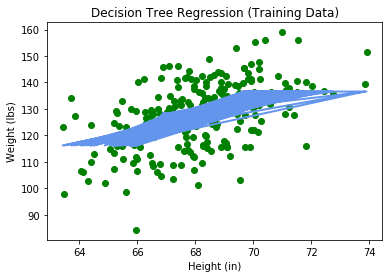

MSE: 105.270984429


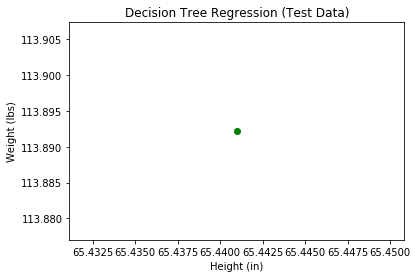

MSE: 102.182835409


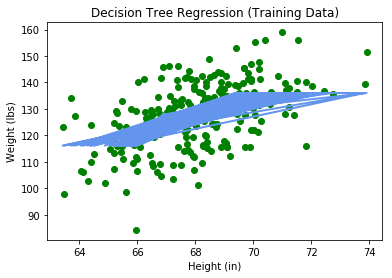

MSE: 102.182835409


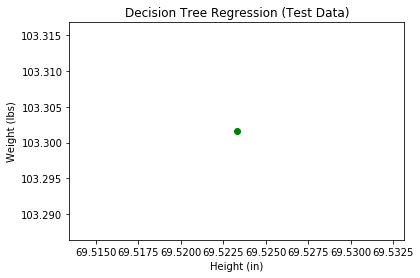

MSE: 105.206528032


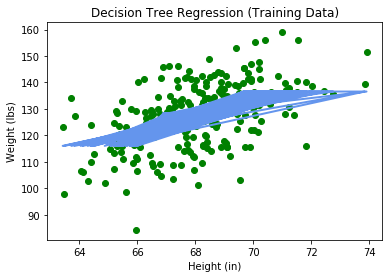

MSE: 105.206528032


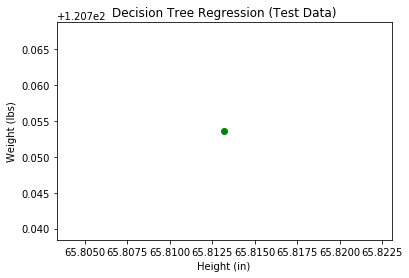

MSE: 105.267620604


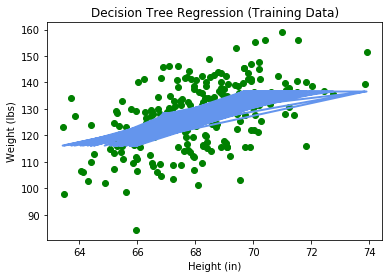

MSE: 105.267620604


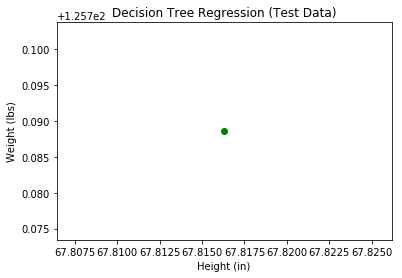

MSE: 105.292150956


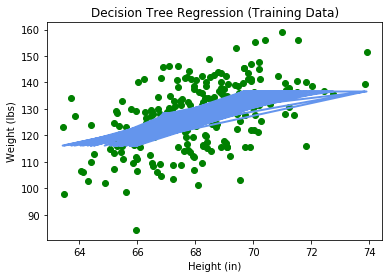

MSE: 105.292150956


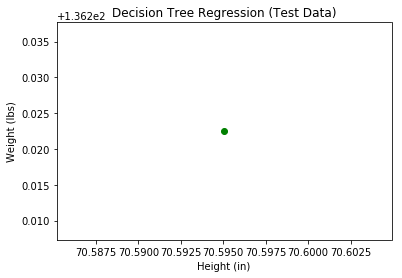

MSE: 105.241826022


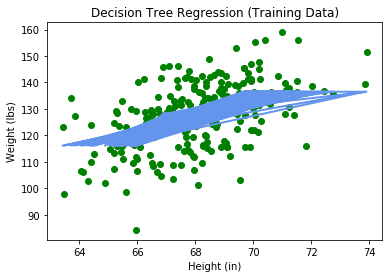

MSE: 105.241826022


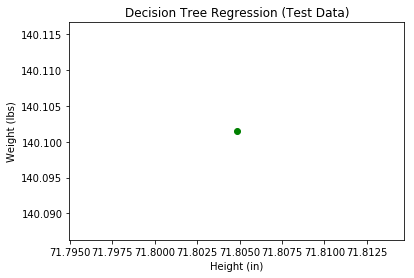

MSE: 105.291764691


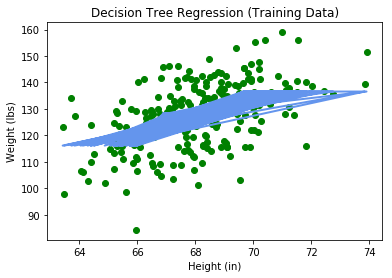

MSE: 105.291764691


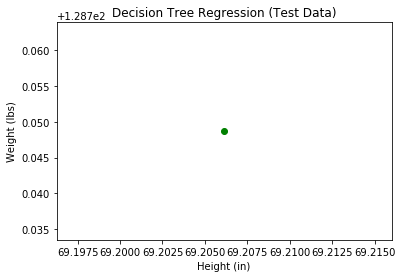

MSE: 103.780198548


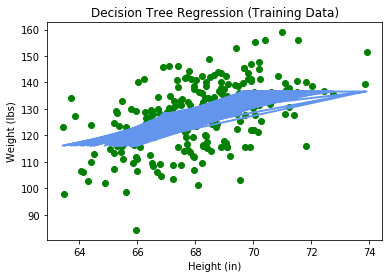

MSE: 103.780198548


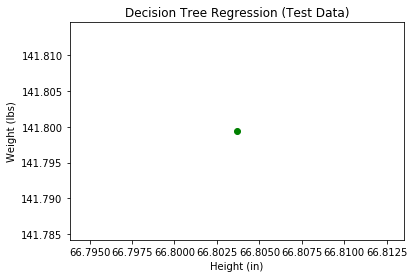

MSE: 105.091218863


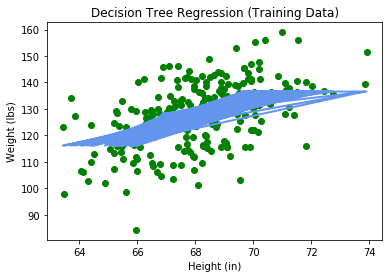

MSE: 105.091218863


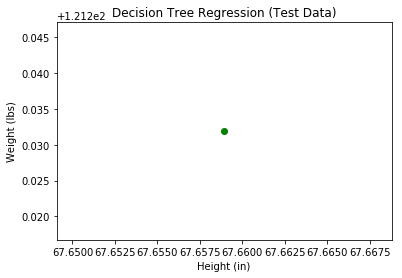

MSE: 105.254228844


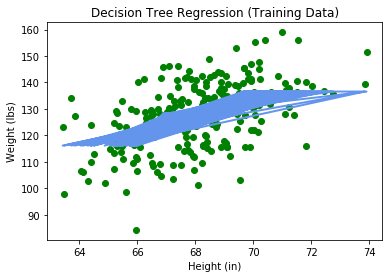

MSE: 105.254228844


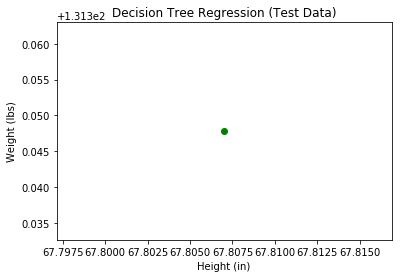

MSE: 104.922178769


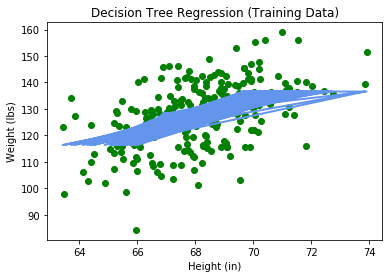

MSE: 104.922178769


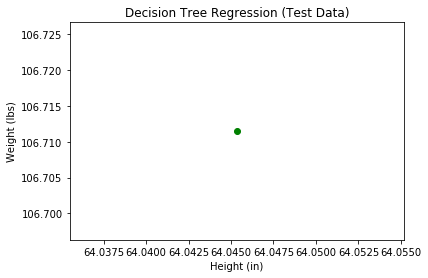

MSE: 105.23047528


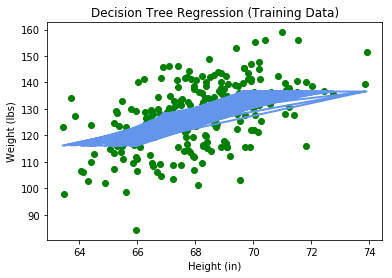

MSE: 105.23047528


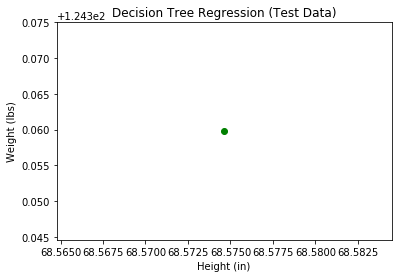

MSE: 104.982087244


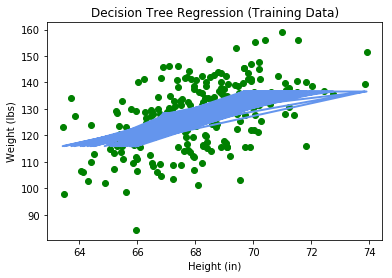

MSE: 104.982087244


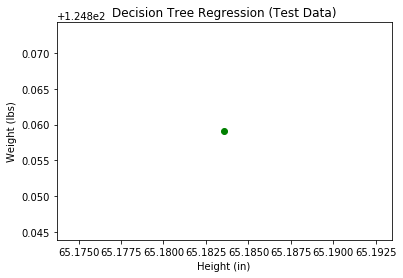

MSE: 105.25351224


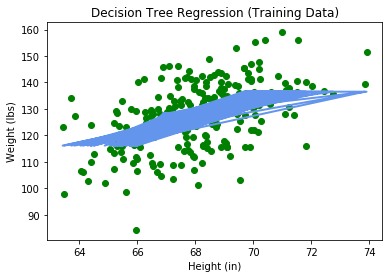

MSE: 105.25351224


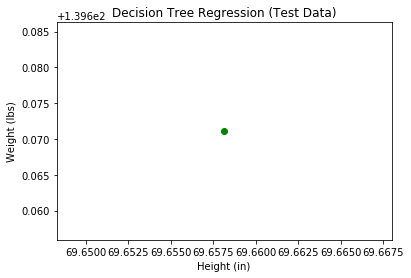

MSE: 104.956233012


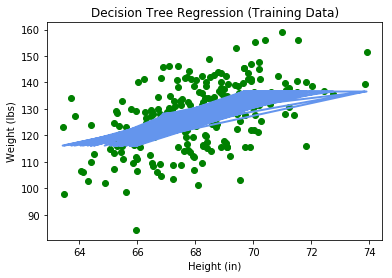

MSE: 104.956233012


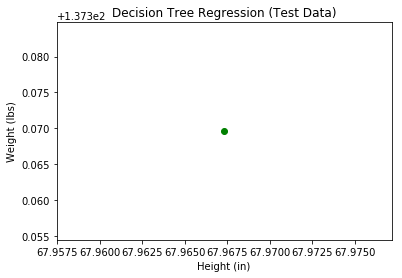

MSE: 104.718663809


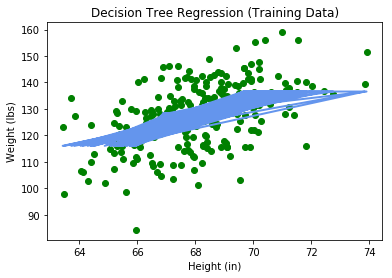

MSE: 104.718663809


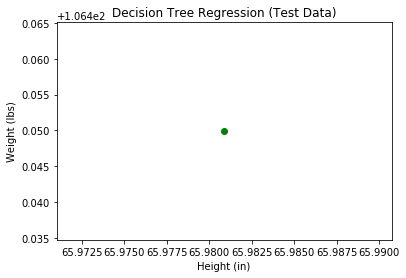

MSE: 105.291704831


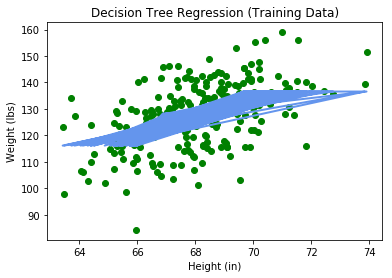

MSE: 105.291704831


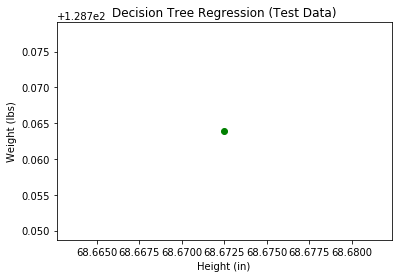

MSE: 103.955364888


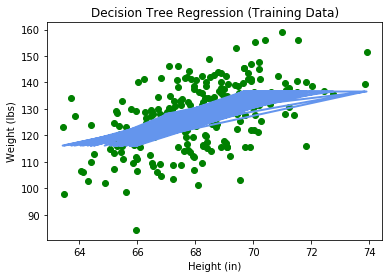

MSE: 103.955364888


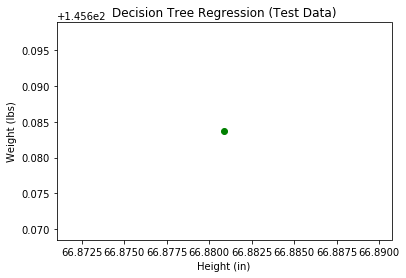

MSE: 104.759481767


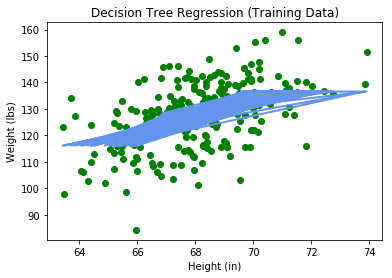

MSE: 104.759481767


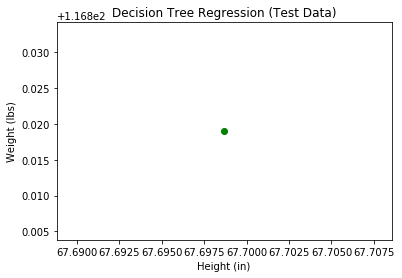

MSE: 105.0890814


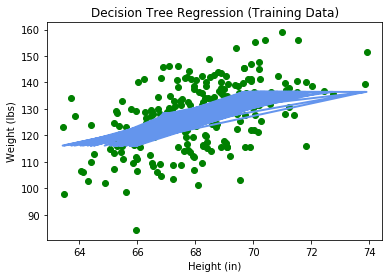

MSE: 105.0890814


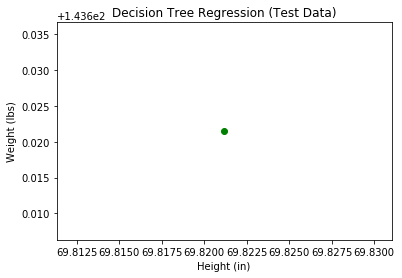

MSE: 105.112349065


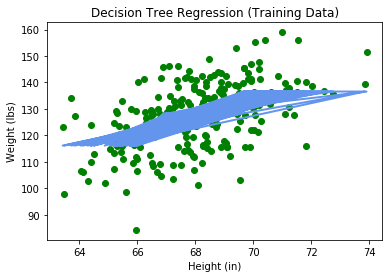

MSE: 105.112349065


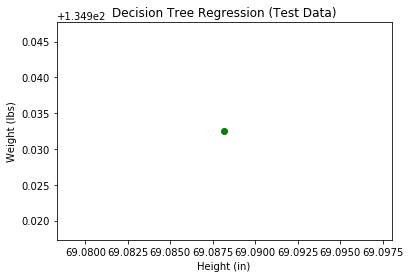

MSE: 104.844778468


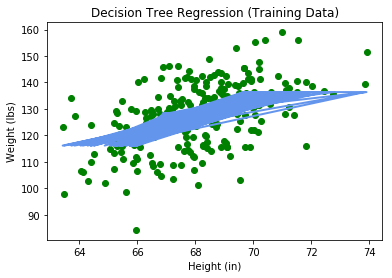

MSE: 104.844778468


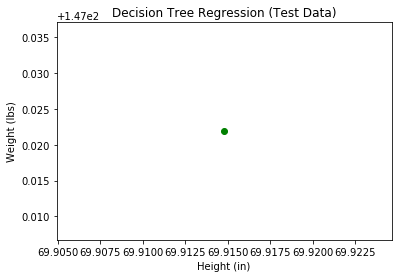

MSE: 105.277335955


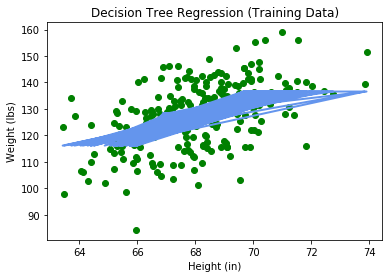

MSE: 105.277335955


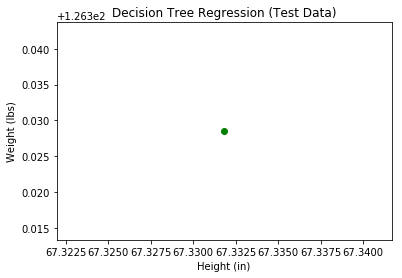

MSE: 104.786105469


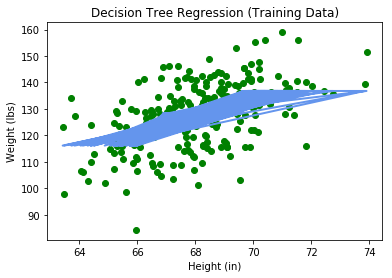

MSE: 104.786105469


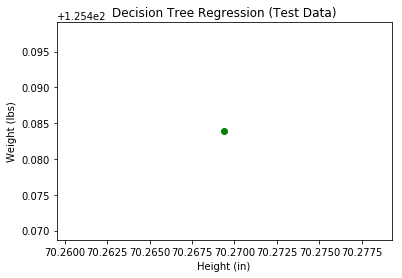

MSE: 104.6510565


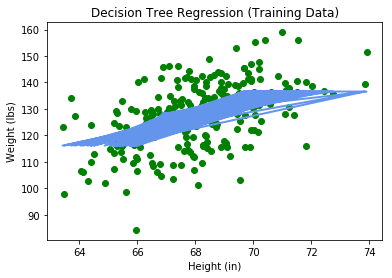

MSE: 104.6510565


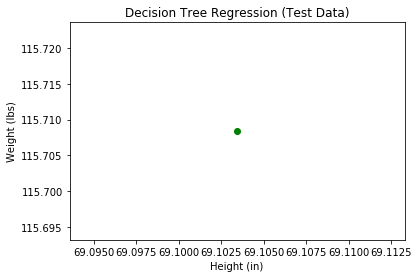

MSE: 105.072448039


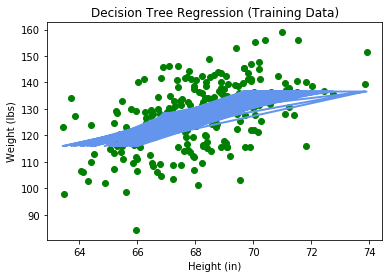

MSE: 105.072448039


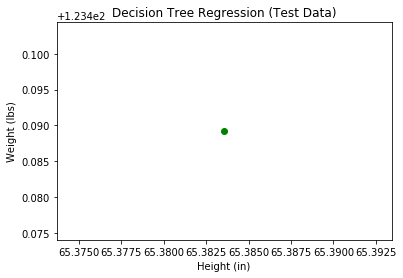

MSE: 104.766933345


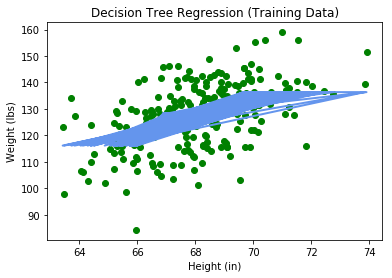

MSE: 104.766933345


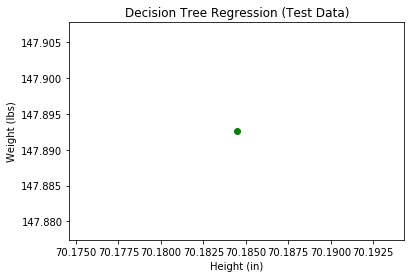

MSE: 103.758960544


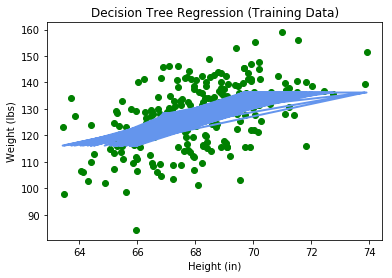

MSE: 103.758960544


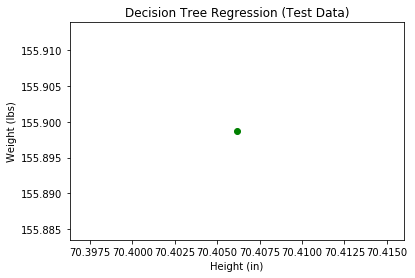

MSE: 105.174776959


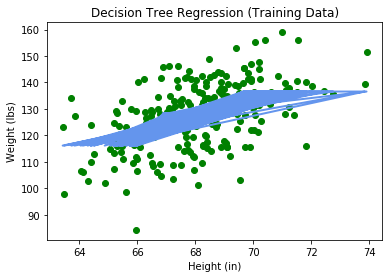

MSE: 105.174776959


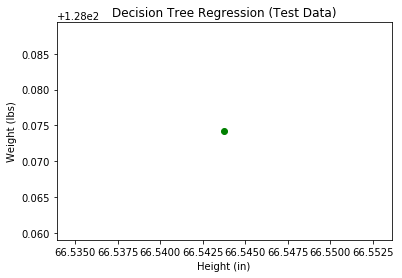

MSE: 105.2448256


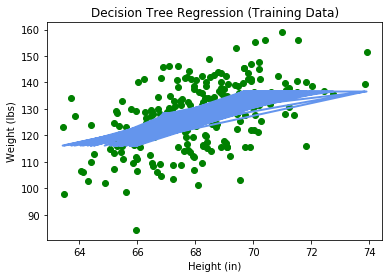

MSE: 105.2448256


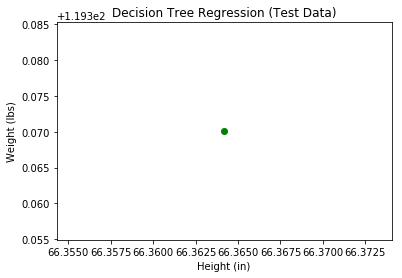

MSE: 105.16779561


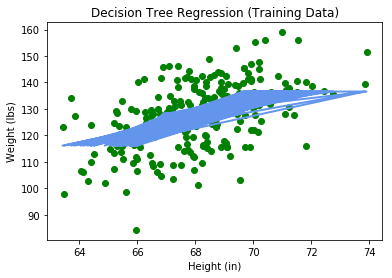

MSE: 105.16779561


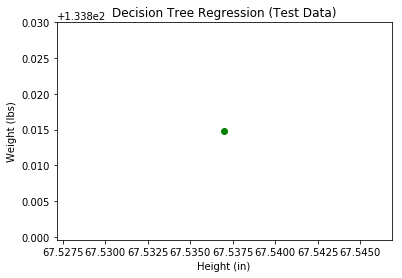

MSE: 105.14377026


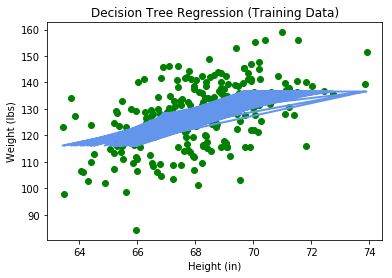

MSE: 105.14377026


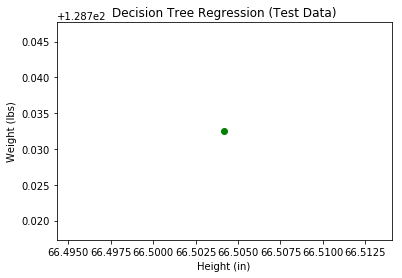

MSE: 104.943111866


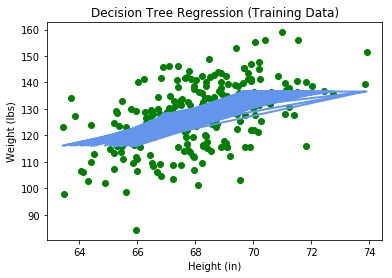

MSE: 104.943111866


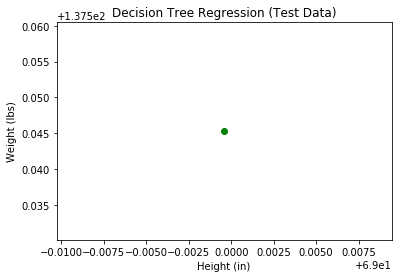

MSE: 105.283682202


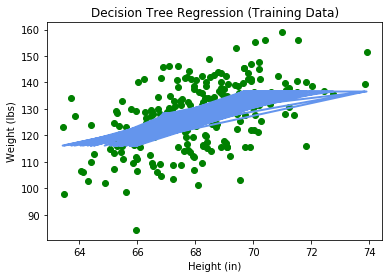

MSE: 105.283682202


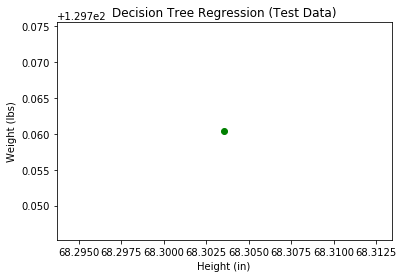

MSE: 105.291449748


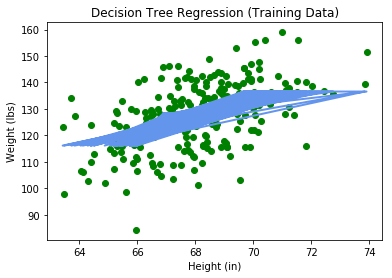

MSE: 105.291449748


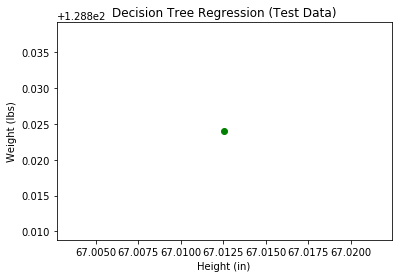

MSE: 105.286081673


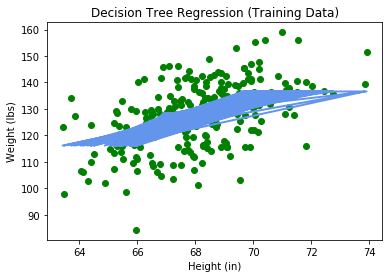

MSE: 105.286081673


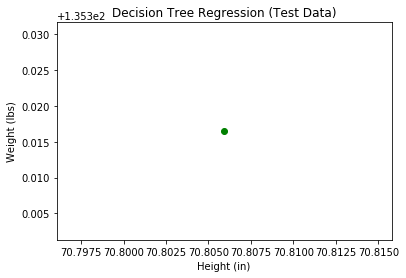

MSE: 103.877168411


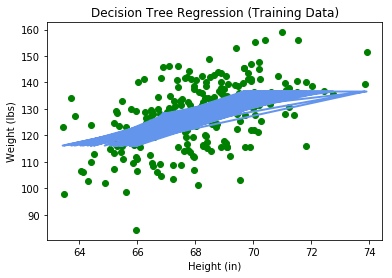

MSE: 103.877168411


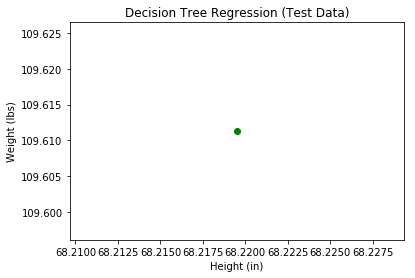

MSE: 104.473418139


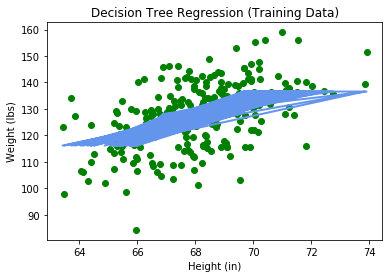

MSE: 104.473418139


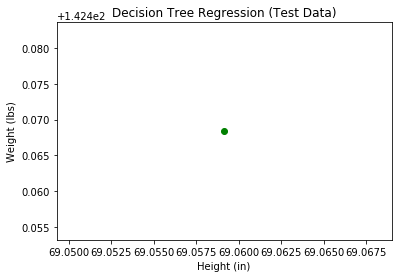

MSE: 105.211207457


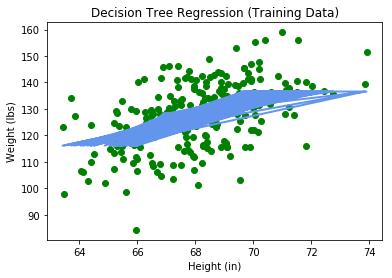

MSE: 105.211207457


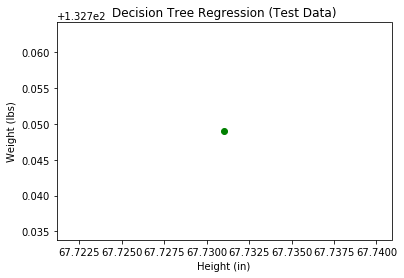

MSE: 102.803723904


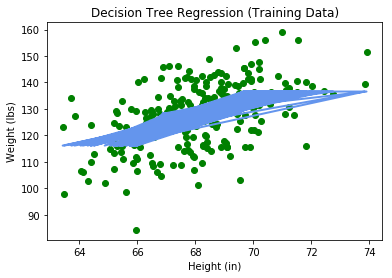

MSE: 102.803723904


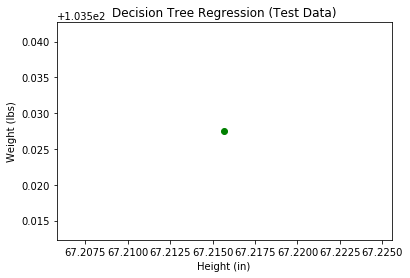

MSE: 105.241689764


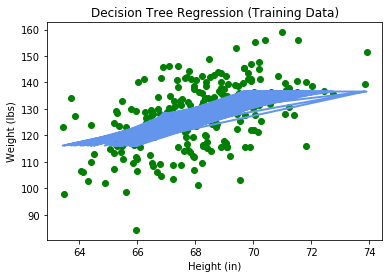

MSE: 105.241689764


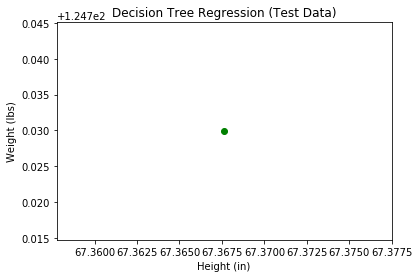

MSE: 104.581143513


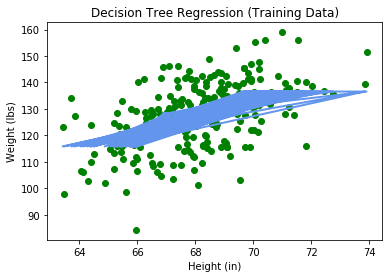

MSE: 104.581143513


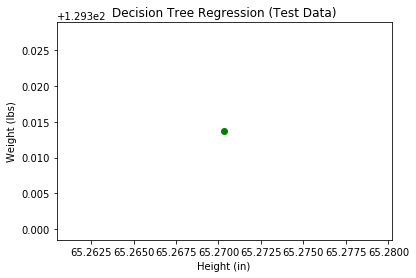

MSE: 105.265603649


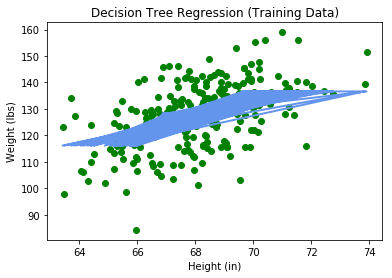

MSE: 105.265603649


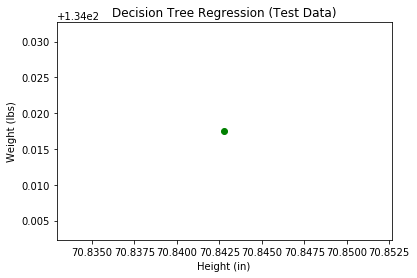

MSE: 105.232923851


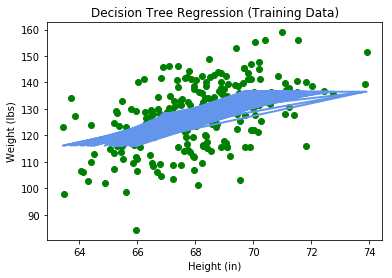

MSE: 105.232923851


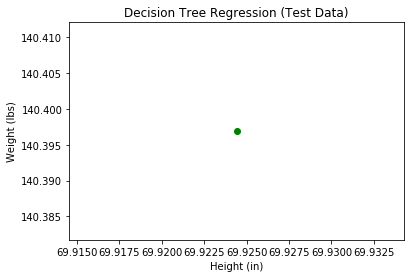

MSE: 104.556936337


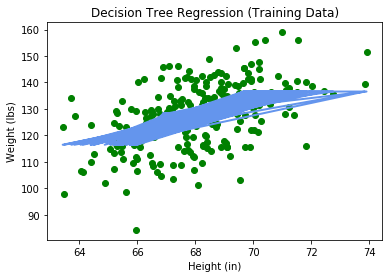

MSE: 104.556936337


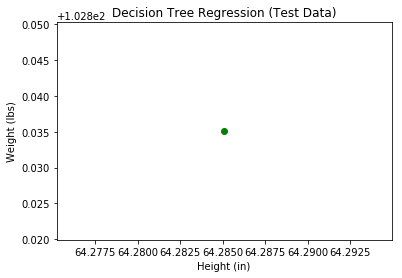

MSE: 105.292435779


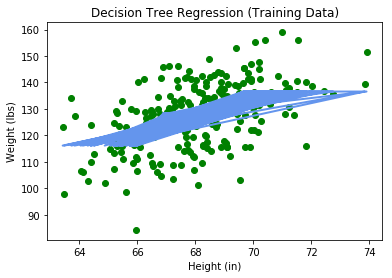

MSE: 105.292435779


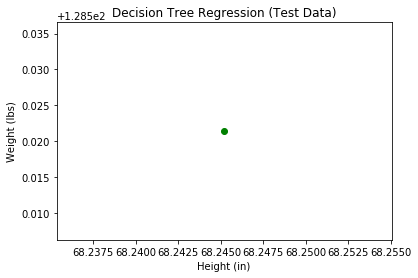

MSE: 105.267478811


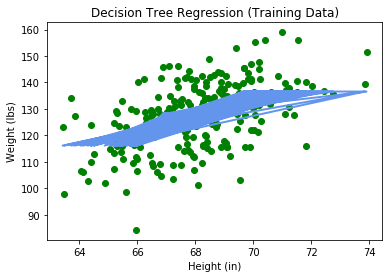

MSE: 105.267478811


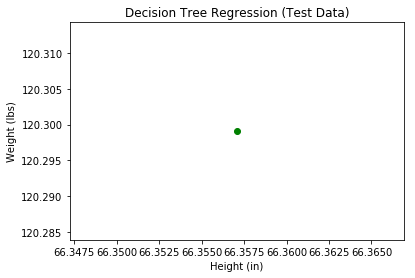

MSE: 104.858770095


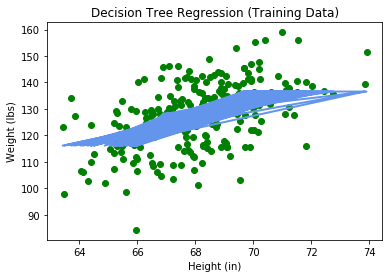

MSE: 104.858770095


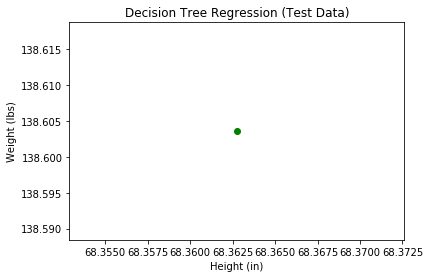

MSE: 104.131370299


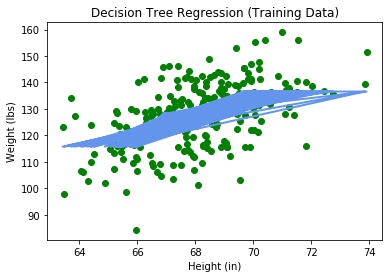

MSE: 104.131370299


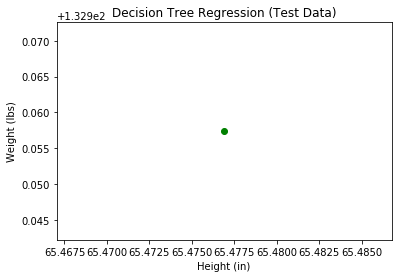

MSE: 103.486341176


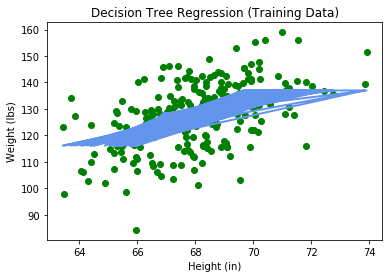

MSE: 103.486341176


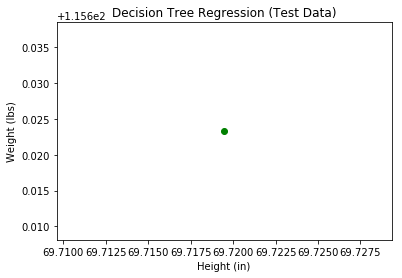

MSE: 105.158386536


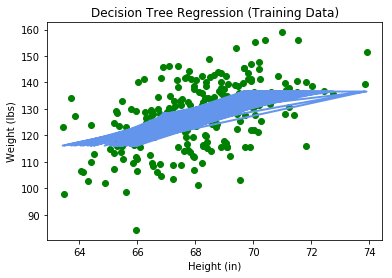

MSE: 105.158386536


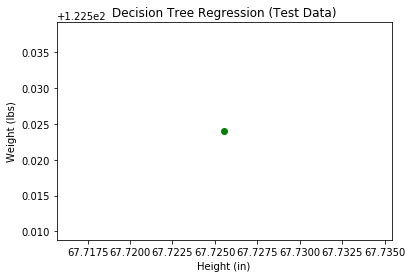

MSE: 105.128595527


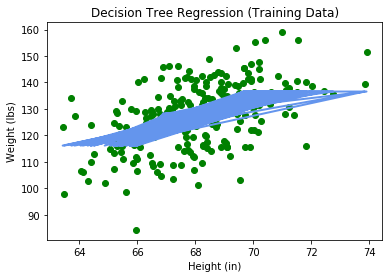

MSE: 105.128595527


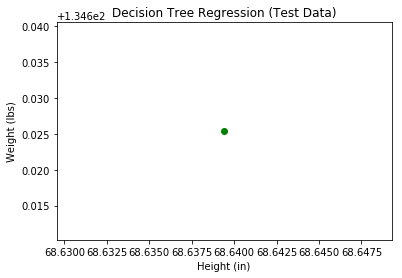

MSE: 105.289611692


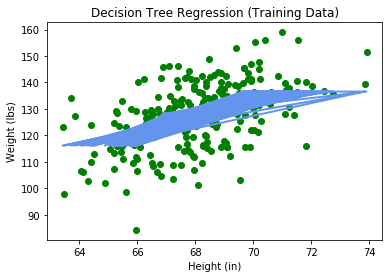

MSE: 105.289611692


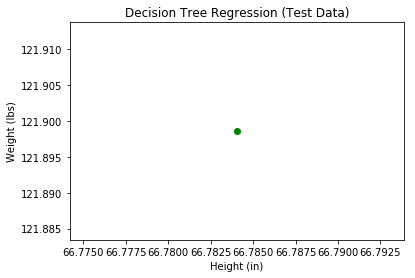

MSE: 103.84074236


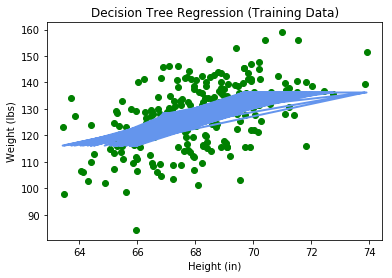

MSE: 103.84074236


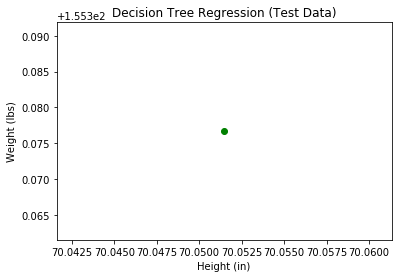

MSE: 105.133154525


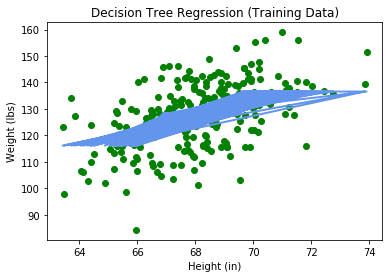

MSE: 105.133154525


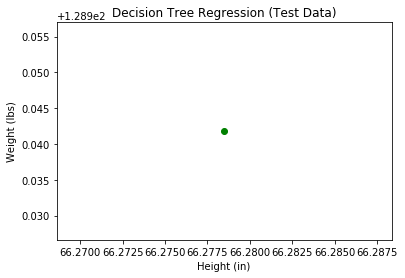

MSE: 105.289892474


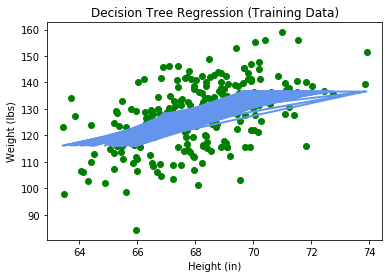

MSE: 105.289892474


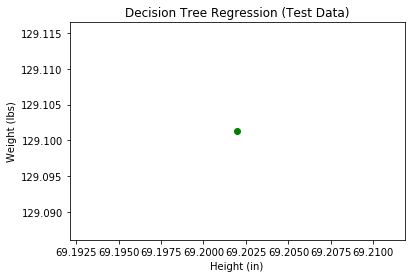

MSE: 104.782642714


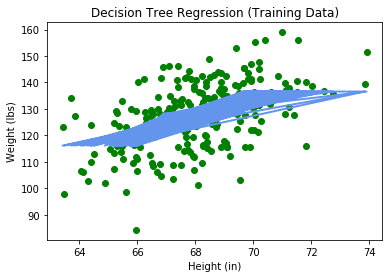

MSE: 104.782642714


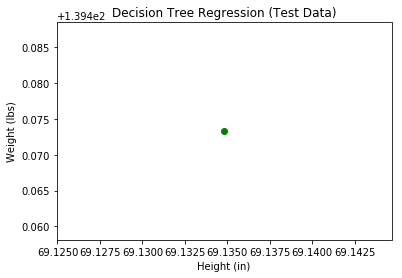

MSE: 104.64545732


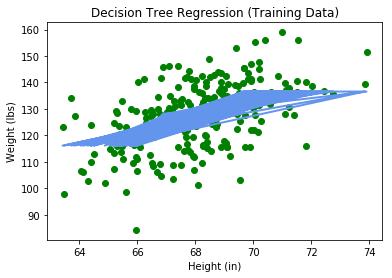

MSE: 104.64545732


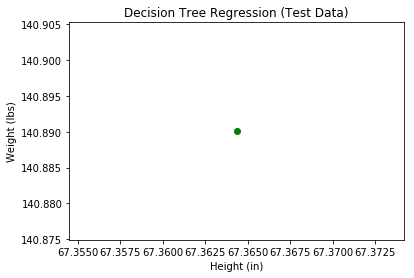

MSE: 105.190209792


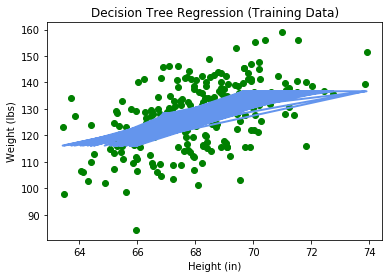

MSE: 105.190209792


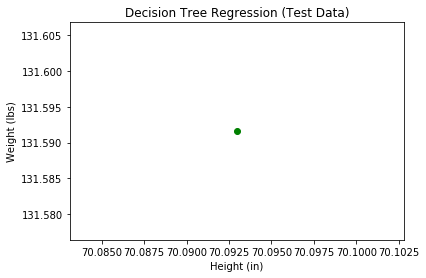

MSE: 104.309908064


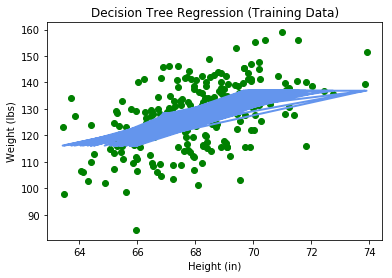

MSE: 104.309908064


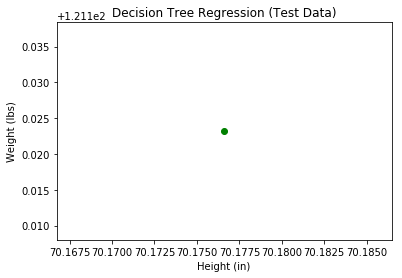

MSE: 105.249994602


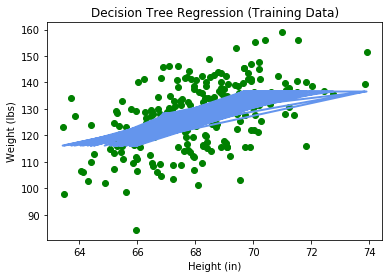

MSE: 105.249994602


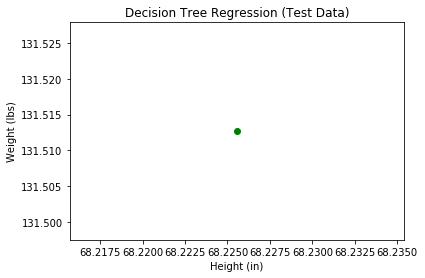

MSE: 105.014265402


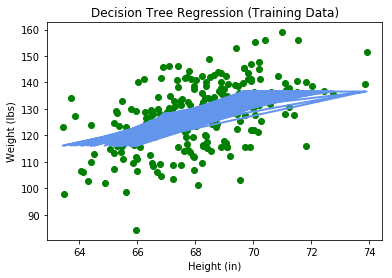

MSE: 105.014265402


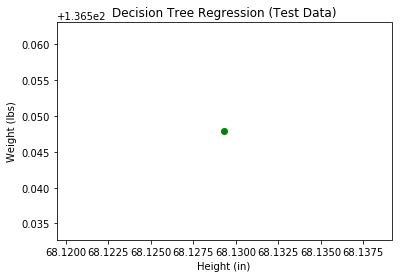

MSE: 105.193758297


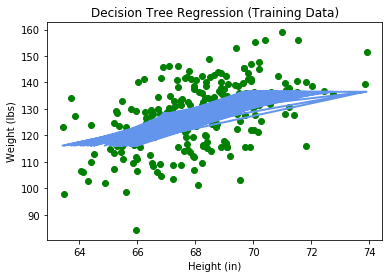

MSE: 105.193758297


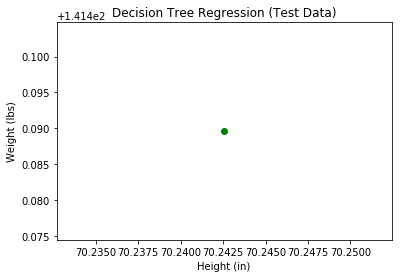

MSE: 105.226043121


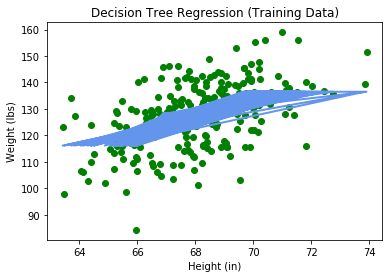

MSE: 105.226043121


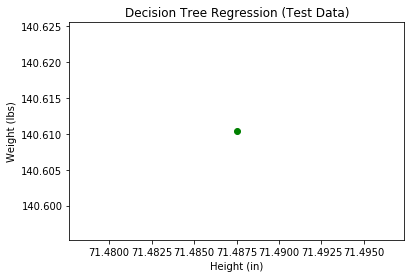

MSE: 104.234980363


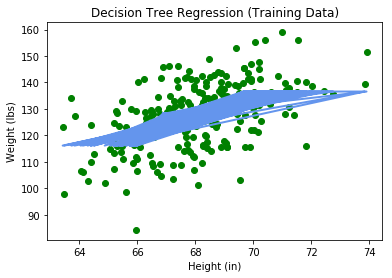

MSE: 104.234980363


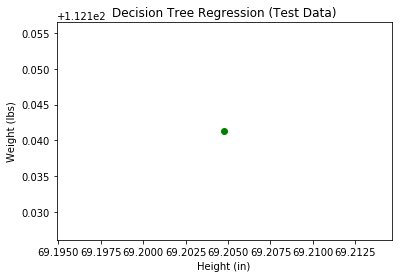

MSE: 105.252482649


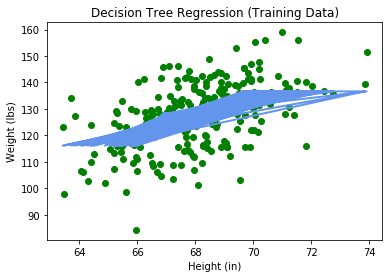

MSE: 105.252482649


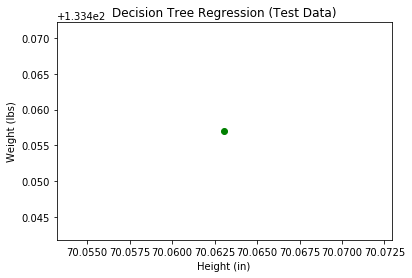

MSE: 105.198590483


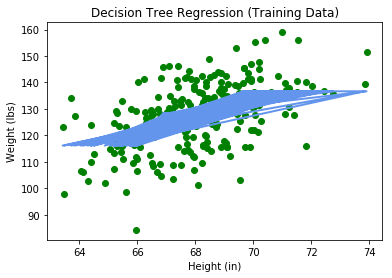

MSE: 105.198590483


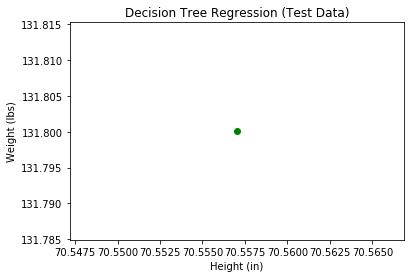

MSE: 105.261623534


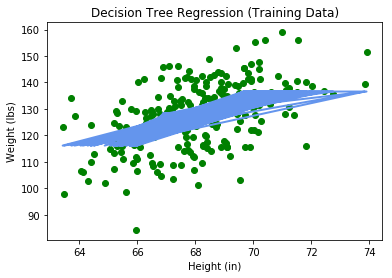

MSE: 105.261623534


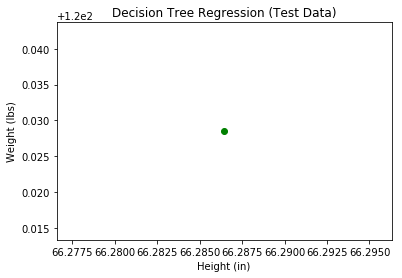

MSE: 105.09545374


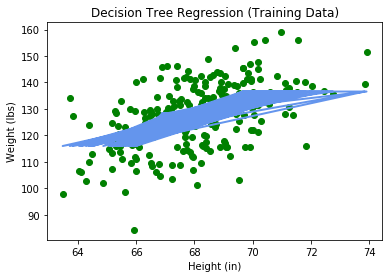

MSE: 105.09545374


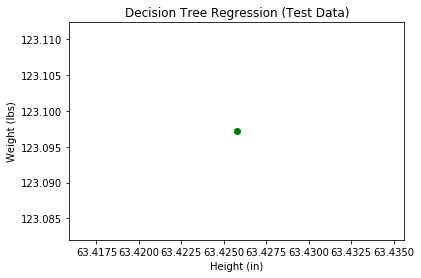

MSE: 105.171696591


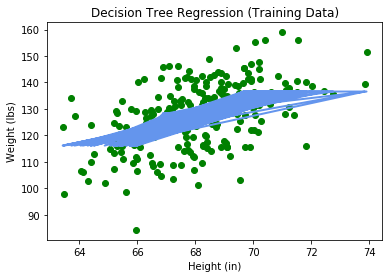

MSE: 105.171696591


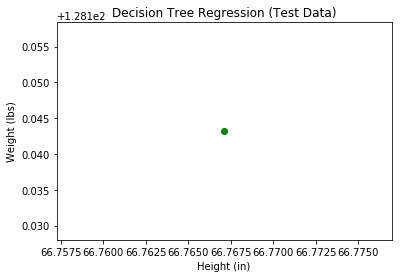

MSE: 104.627088679


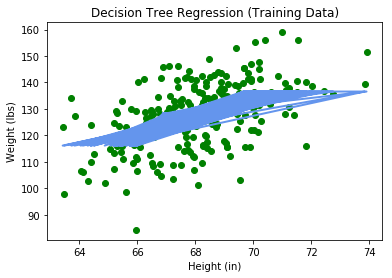

MSE: 104.627088679


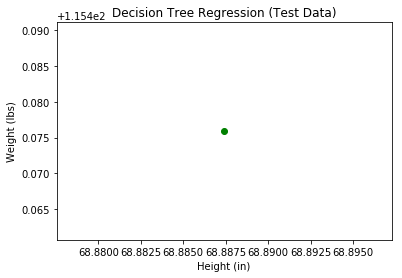

MSE: 104.472830067


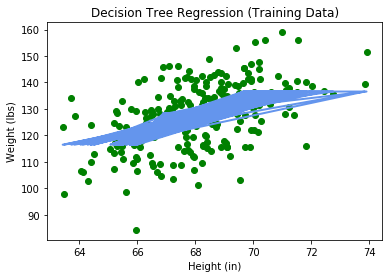

MSE: 104.472830067


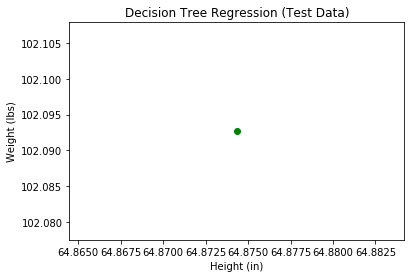

MSE: 105.275083243


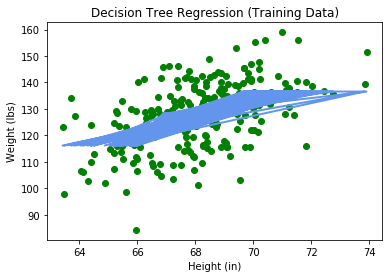

MSE: 105.275083243


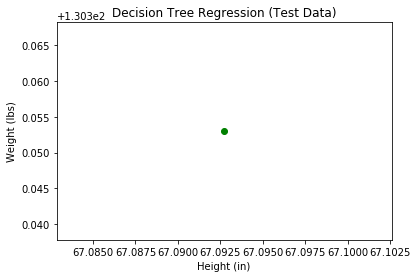

MSE: 105.150594186


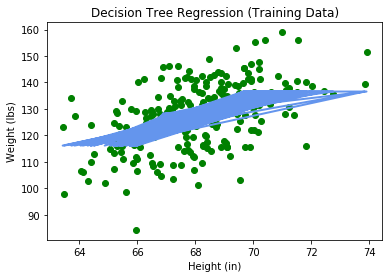

MSE: 105.150594186


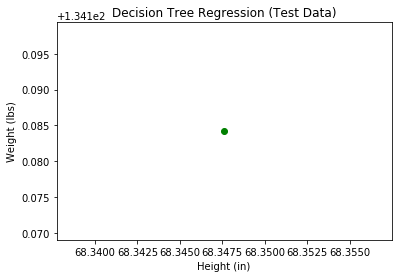

MSE: 104.02207187


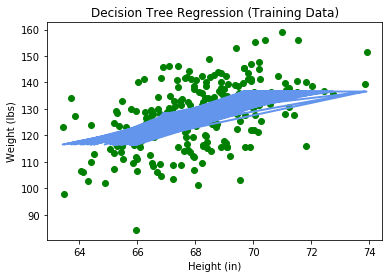

MSE: 104.02207187


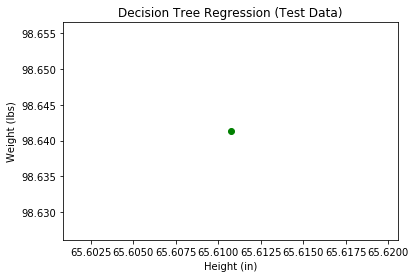

MSE: 104.528384087


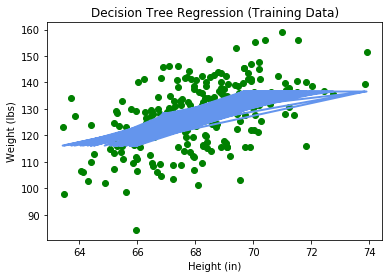

MSE: 104.528384087


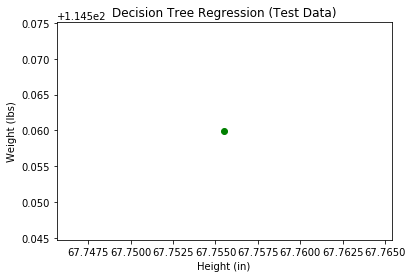

MSE: 105.199801349


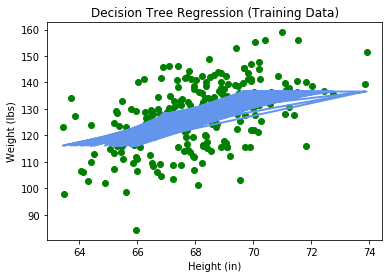

MSE: 105.199801349


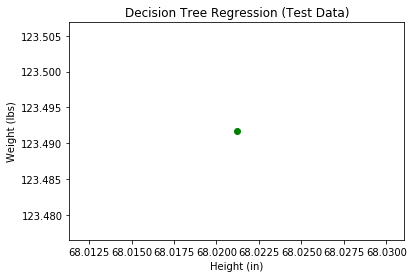

MSE: 105.181757366


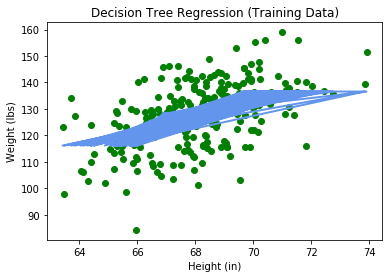

MSE: 105.181757366


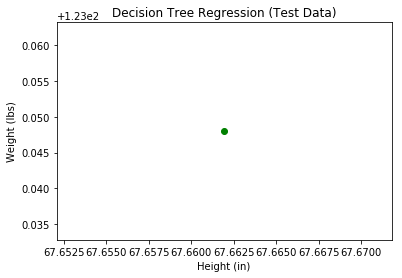

MSE: 105.234973689


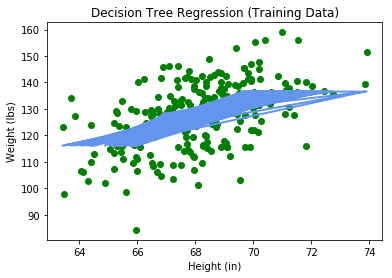

MSE: 105.234973689


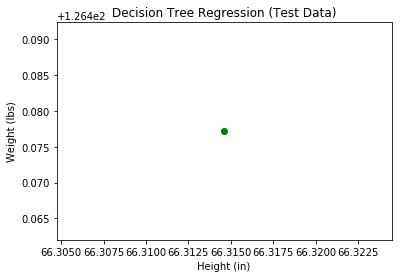

MSE: 105.292603243


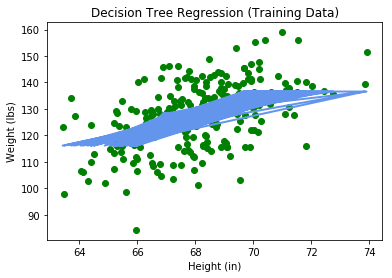

MSE: 105.292603243


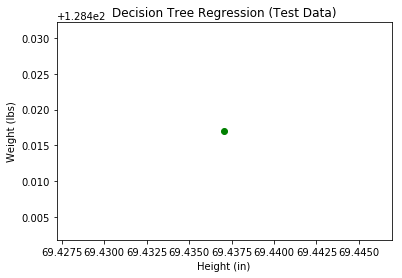

MSE: 104.792353537


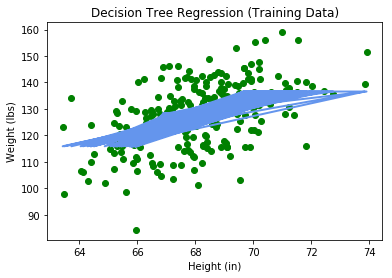

MSE: 104.792353537


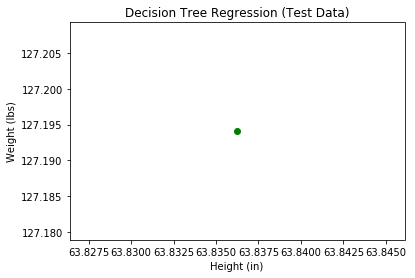

MSE: 105.13563624


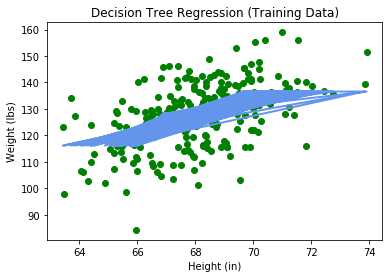

MSE: 105.13563624


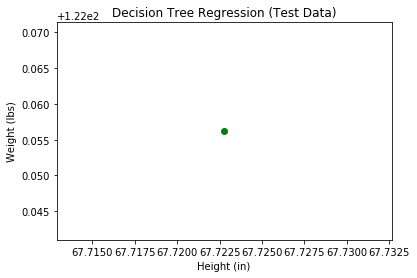

MSE: 104.961312608


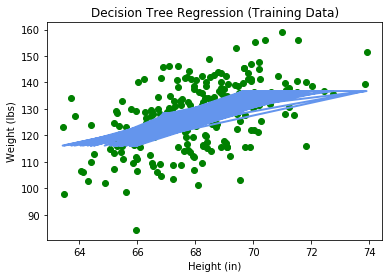

MSE: 104.961312608


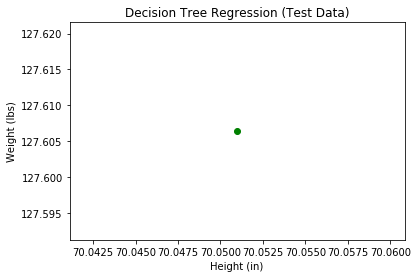

MSE: 105.192280579


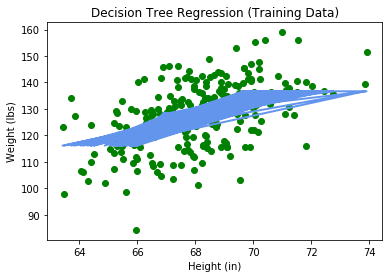

MSE: 105.192280579


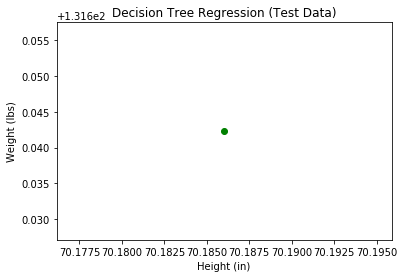

MSE: 105.216725069


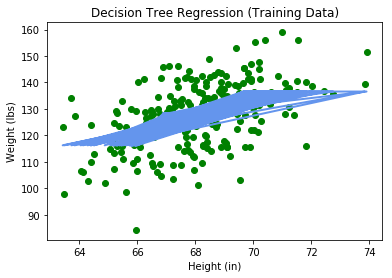

MSE: 105.216725069


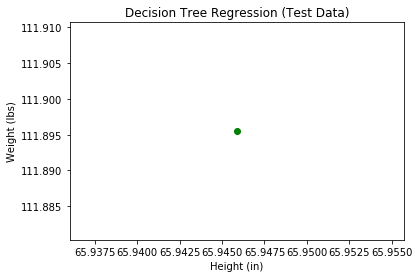

MSE: 104.422885868


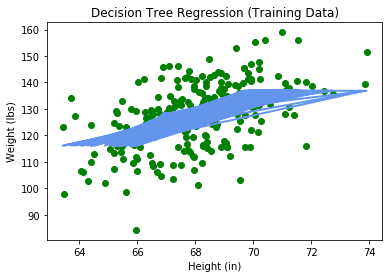

MSE: 104.422885868


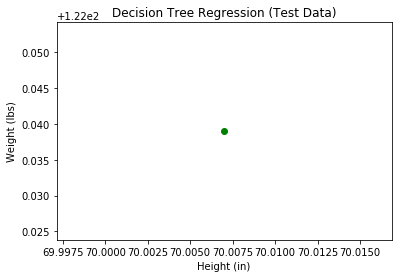

MSE: 105.292363724


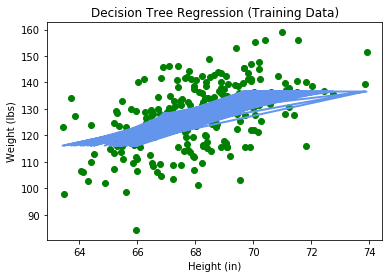

MSE: 105.292363724


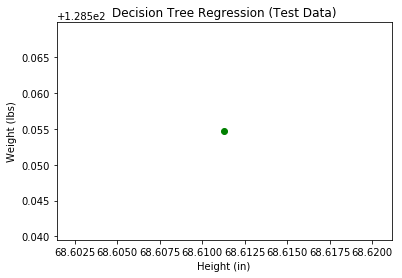

MSE: 105.213728315


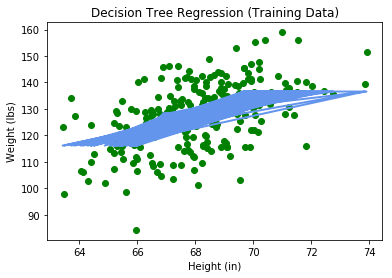

MSE: 105.213728315


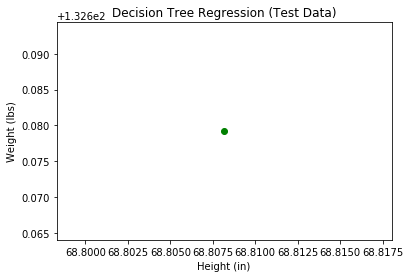

MSE: 105.291572846


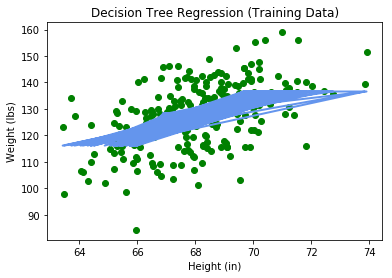

MSE: 105.291572846


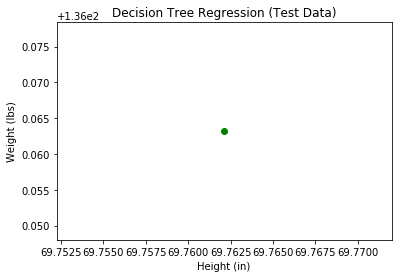

MSE: 105.292441379


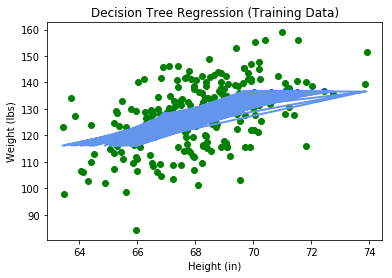

MSE: 105.292441379


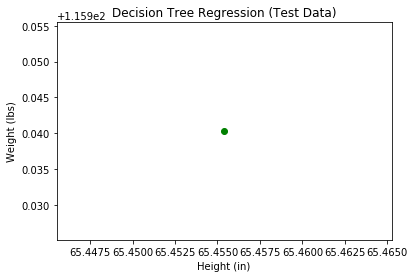

MSE: 104.989782881


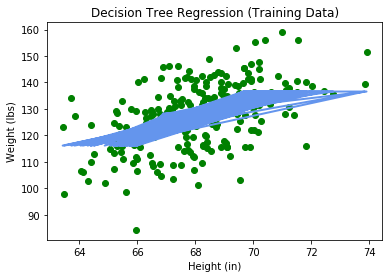

MSE: 104.989782881


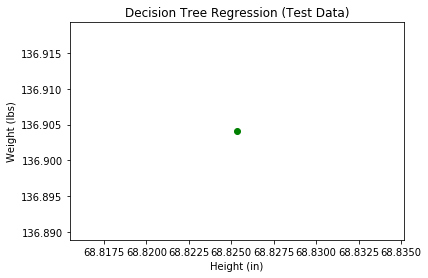

MSE: 105.236317189


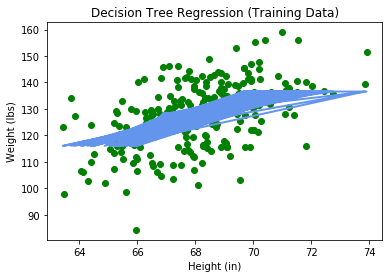

MSE: 105.236317189


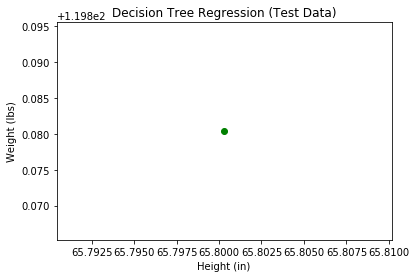

MSE: 103.783769315


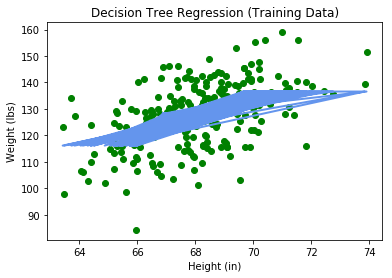

MSE: 103.783769315


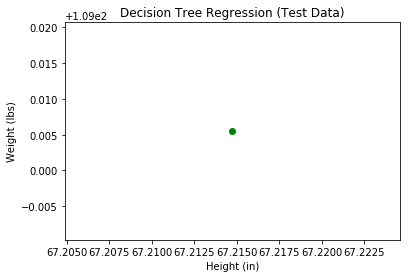

MSE: 105.29268882


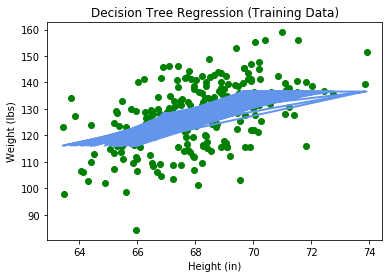

MSE: 105.29268882


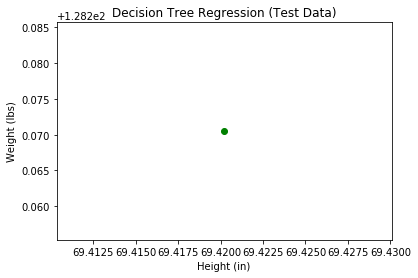

MSE: 105.092396287


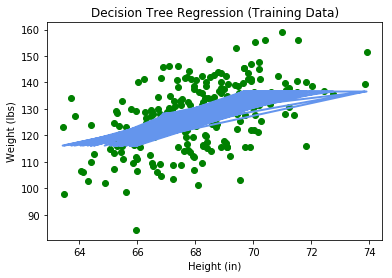

MSE: 105.092396287


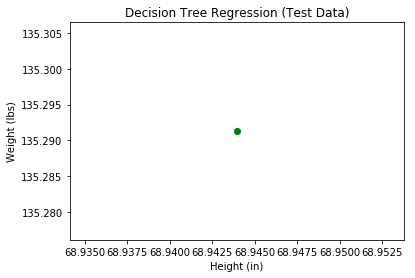

MSE: 103.428260479


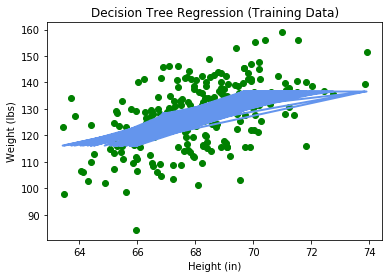

MSE: 103.428260479


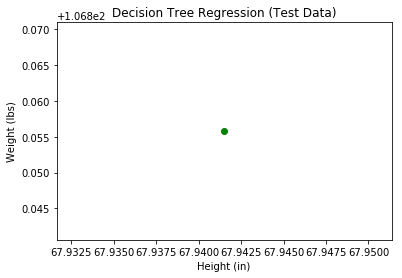

MSE: 105.084068397


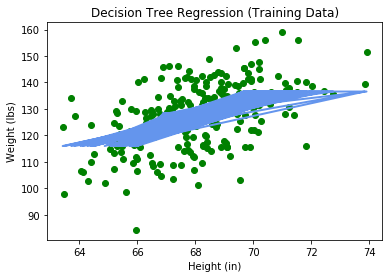

MSE: 105.084068397


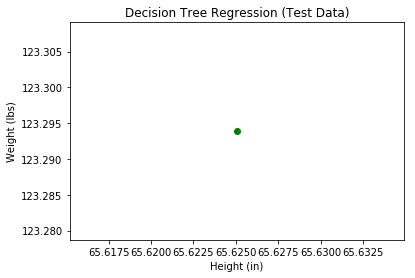

MSE: 104.561117298


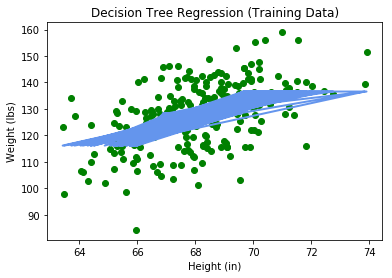

MSE: 104.561117298


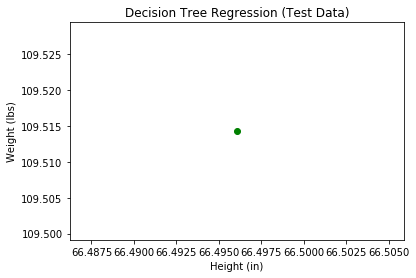

MSE: 104.966107654


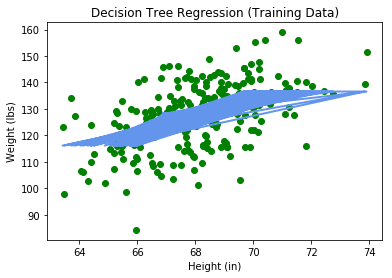

MSE: 104.966107654


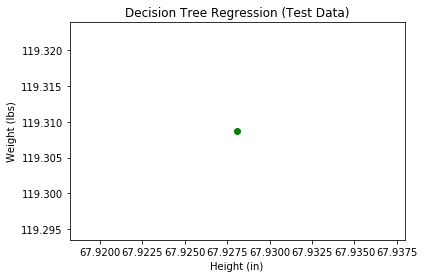

MSE: 104.71041165


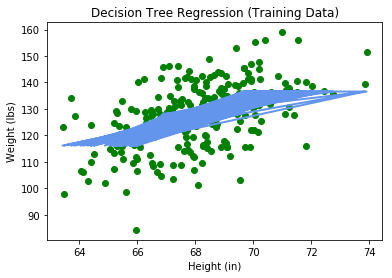

MSE: 104.71041165


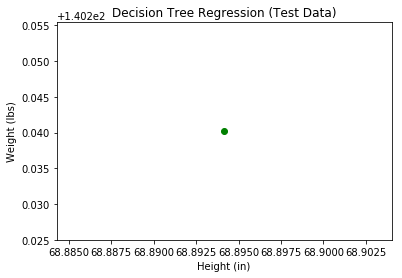

MSE: 105.264894153


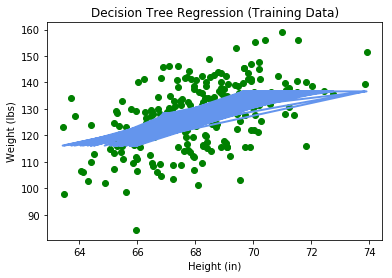

MSE: 105.264894153


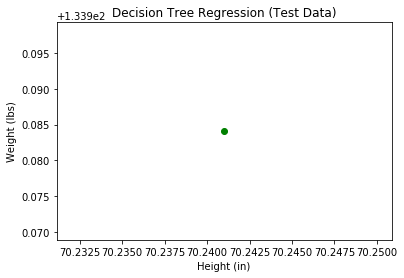

MSE: 105.217218297


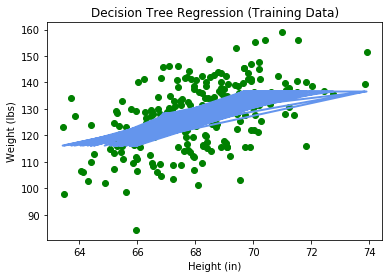

MSE: 105.217218297


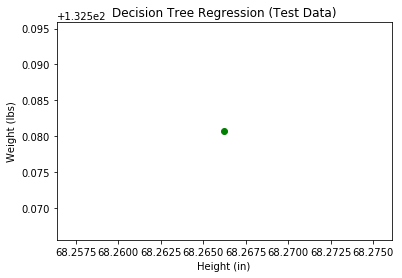

MSE: 105.150281133


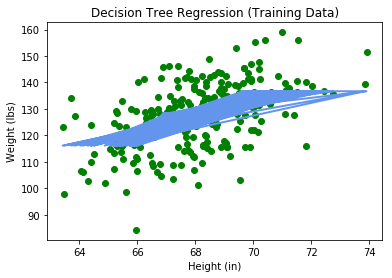

MSE: 105.150281133


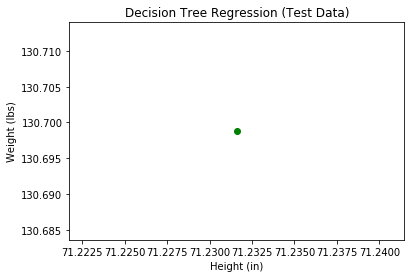

MSE: 104.636191398


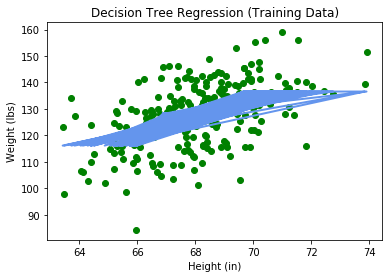

MSE: 104.636191398


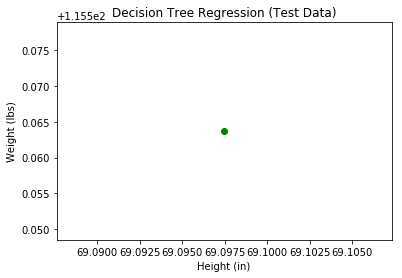

MSE: 105.053676871


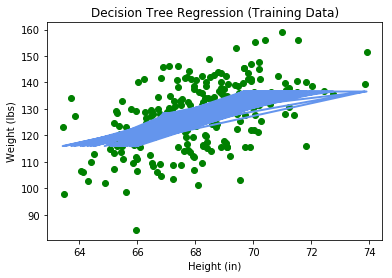

MSE: 105.053676871


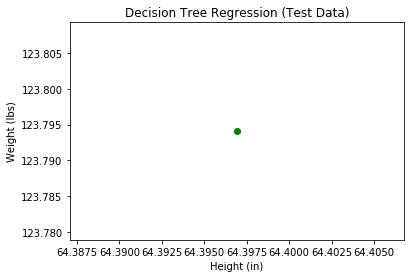

MSE: 104.999720456


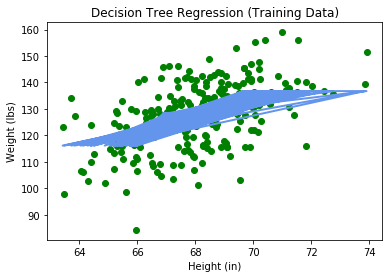

MSE: 104.999720456


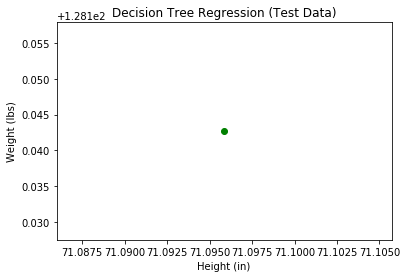

MSE: 105.052129393


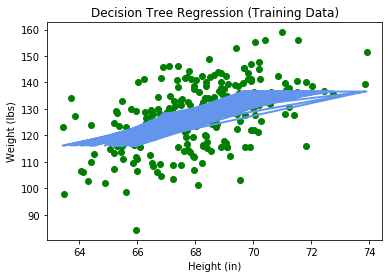

MSE: 105.052129393


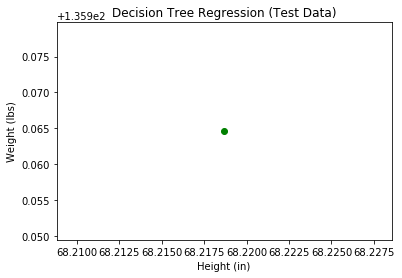

MSE: 105.29188168


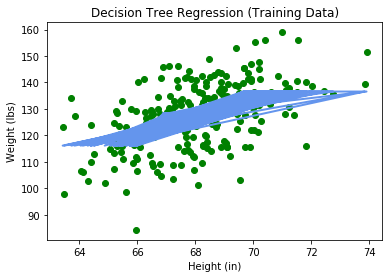

MSE: 105.29188168


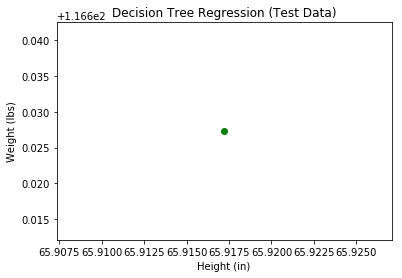

MSE: 105.284167985


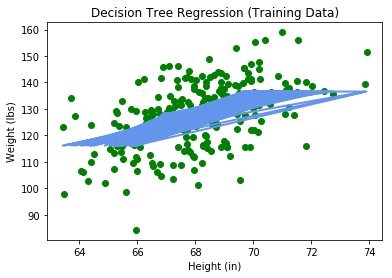

MSE: 105.284167985


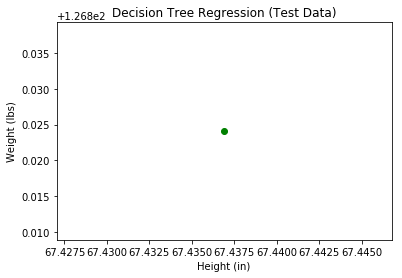

MSE: 104.391280625


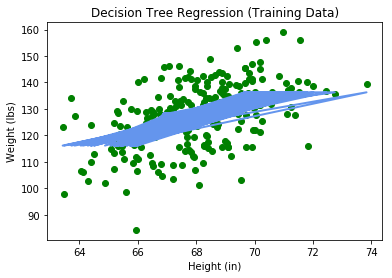

MSE: 104.391280625


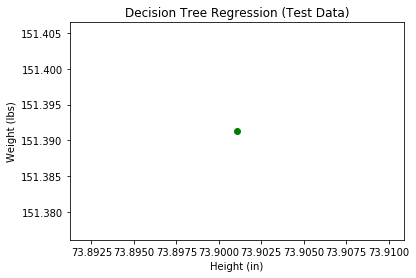

MSE: 105.135565927


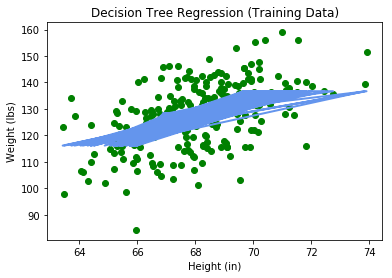

MSE: 105.135565927


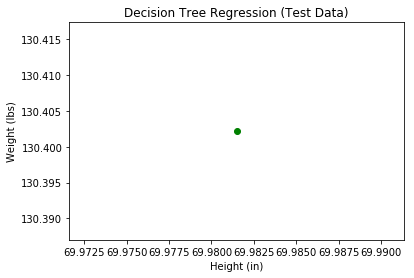

MSE: 105.036743197


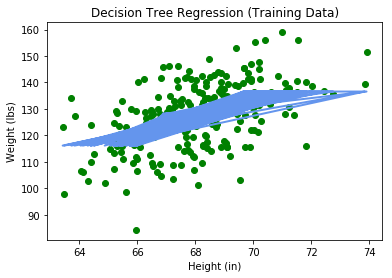

MSE: 105.036743197


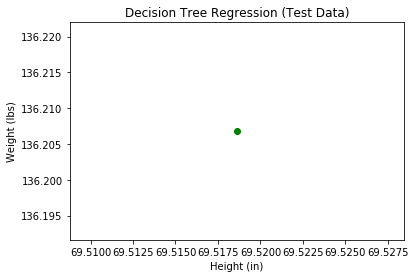

MSE: 105.260640872


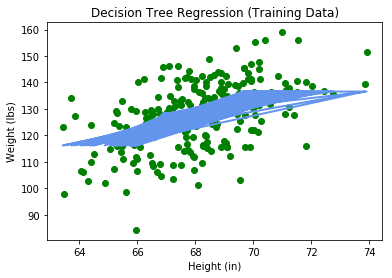

MSE: 105.260640872


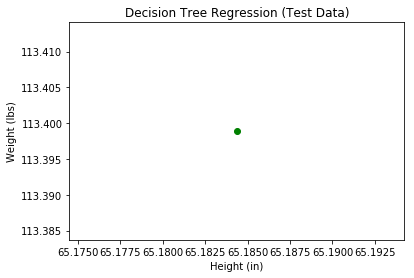

MSE: 105.257475693


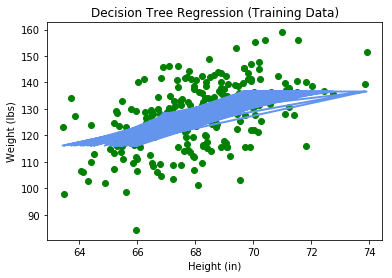

MSE: 105.257475693


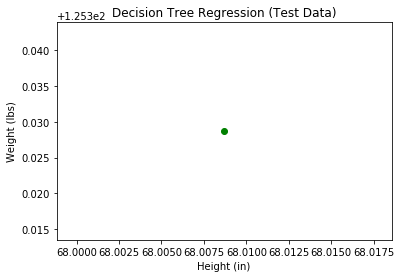

MSE: 105.290768574


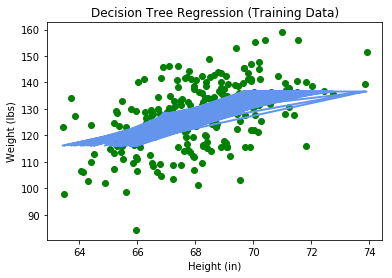

MSE: 105.290768574


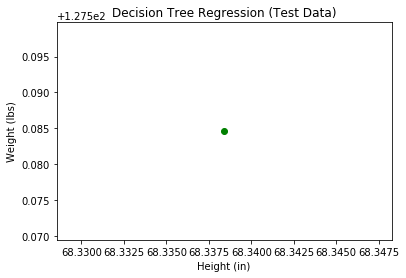

MSE: 104.956161389


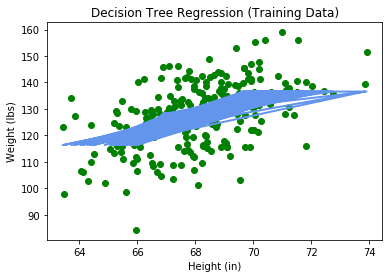

MSE: 104.956161389


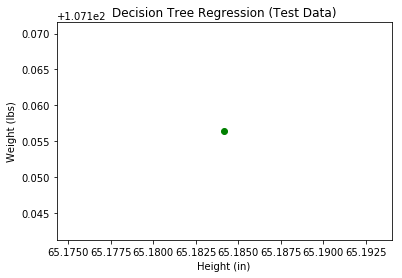

MSE: 104.725415044


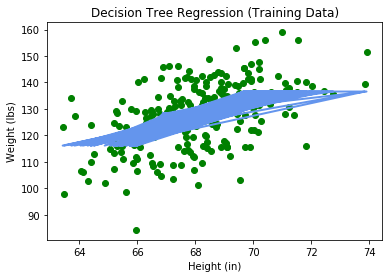

MSE: 104.725415044


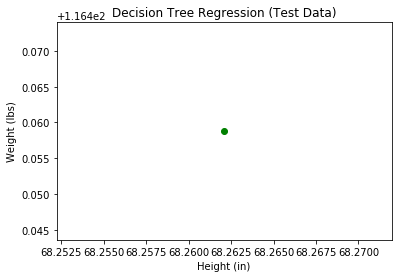

MSE: 105.166648356


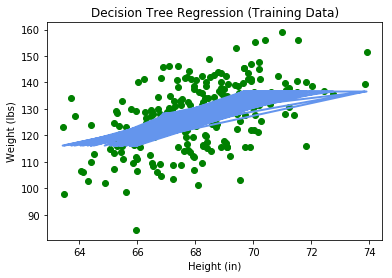

MSE: 105.166648356


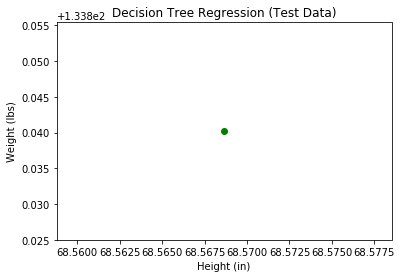

MSE: 105.247867439


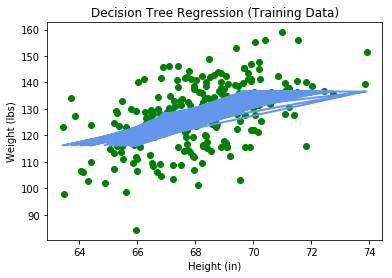

MSE: 105.247867439


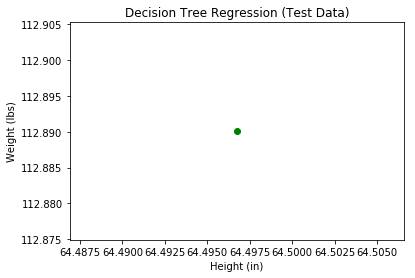

MSE: 105.267588323


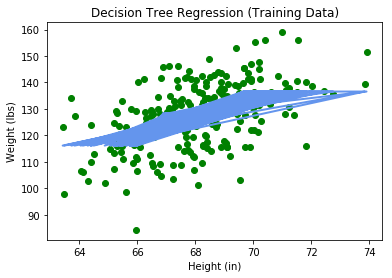

MSE: 105.267588323


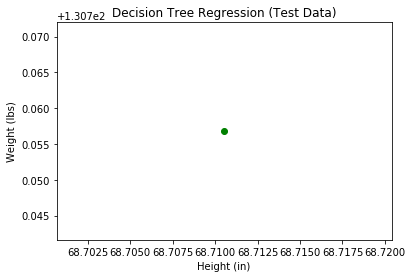

MSE: 104.92696117


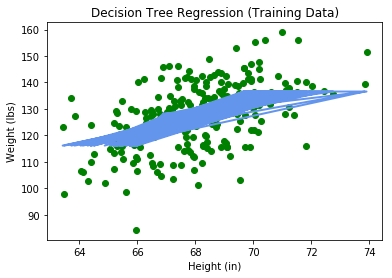

MSE: 104.92696117


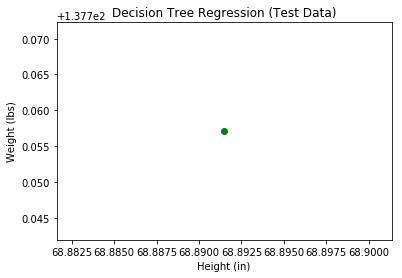

MSE: 105.25924513


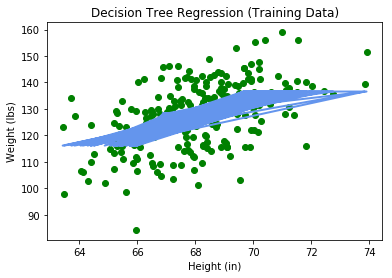

MSE: 105.25924513


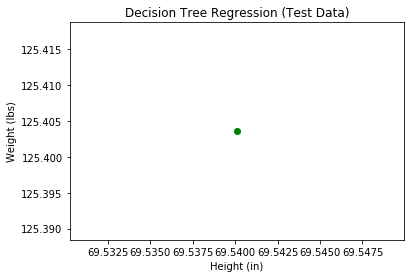

MSE: 104.87025948


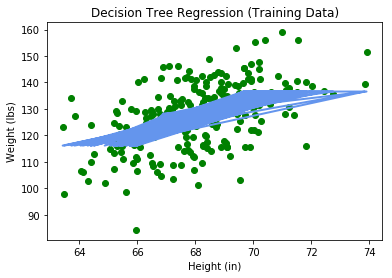

MSE: 104.87025948


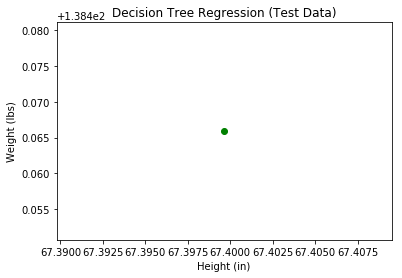

MSE: 105.277004442


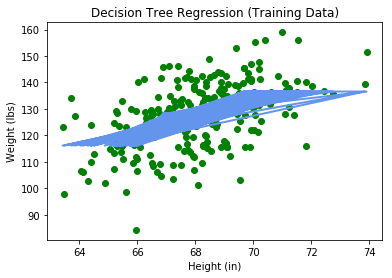

MSE: 105.277004442


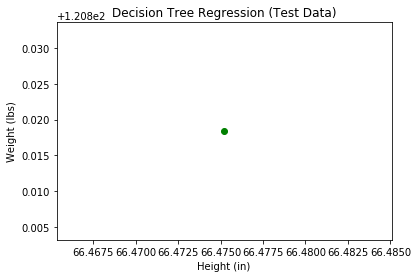

MSE: 103.791846887


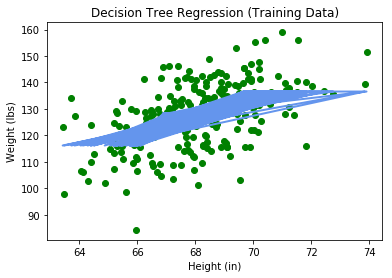

MSE: 103.791846887


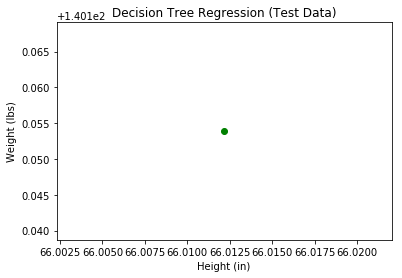

MSE: 105.292589415


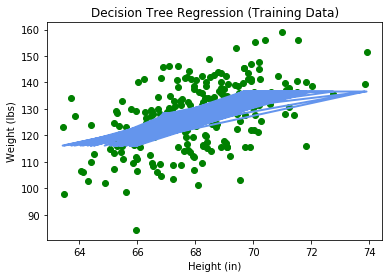

MSE: 105.292589415


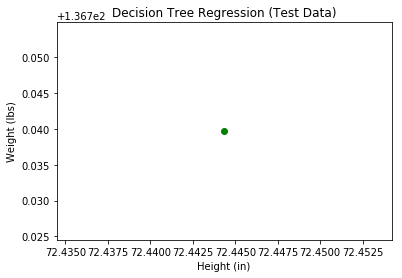

MSE: 104.873960626


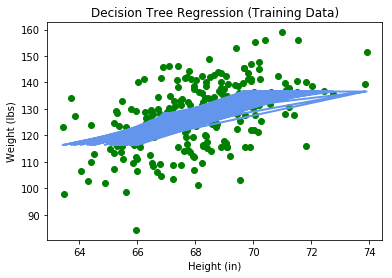

MSE: 104.873960626


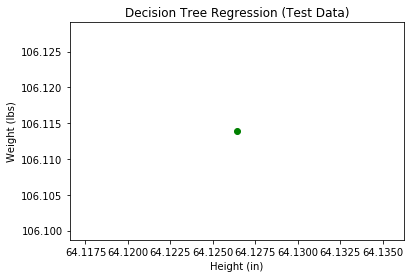

MSE: 103.234945946


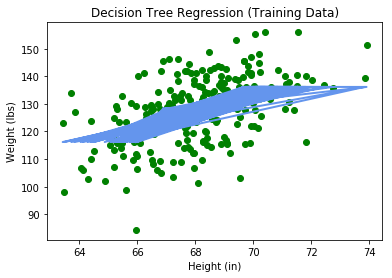

MSE: 103.234945946


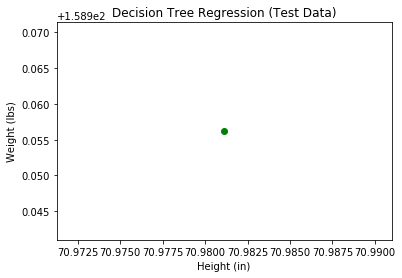

MSE: 103.749318285


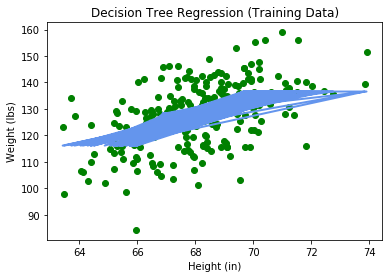

MSE: 103.749318285


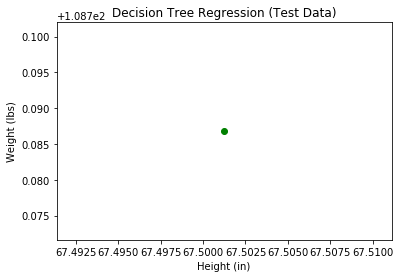

MSE: 105.272941694


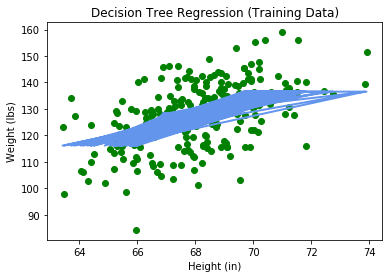

MSE: 105.272941694


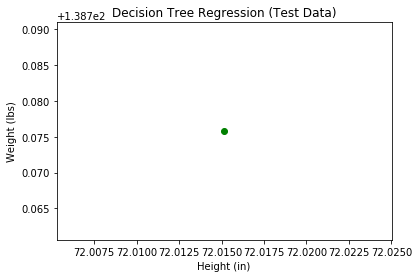

MSE: 105.292384464


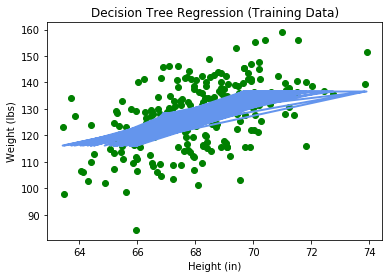

MSE: 105.292384464


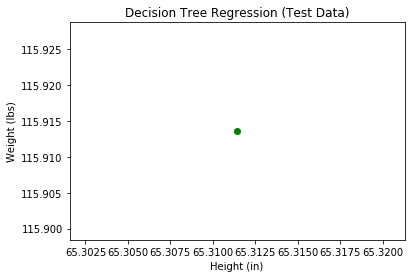

MSE: 103.229986196


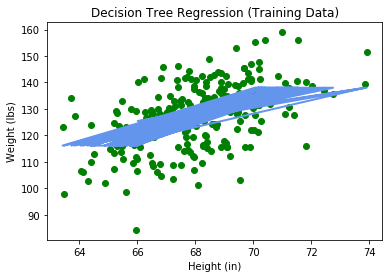

MSE: 103.229986196


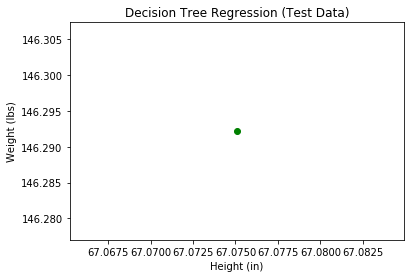

MSE: 105.128388996


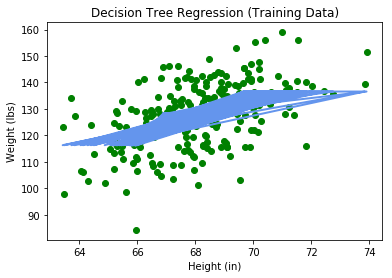

MSE: 105.128388996


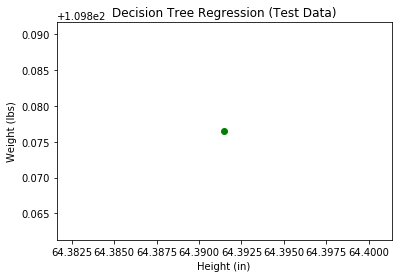

MSE: 104.820472297


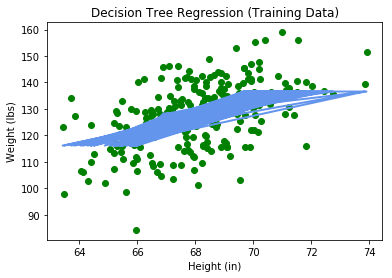

MSE: 104.820472297


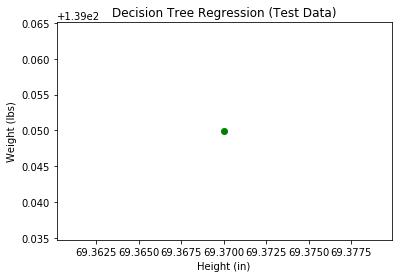

MSE: 105.007782125


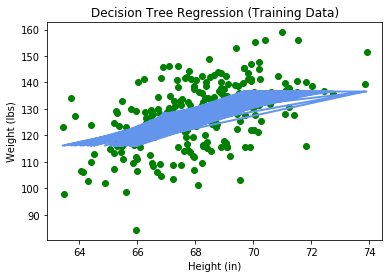

MSE: 105.007782125


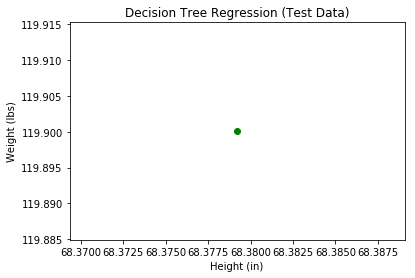

MSE: 104.686092449


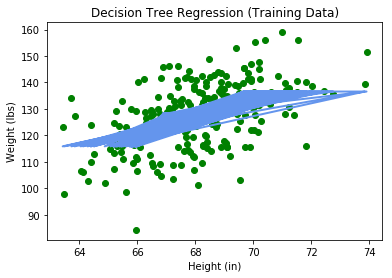

MSE: 104.686092449


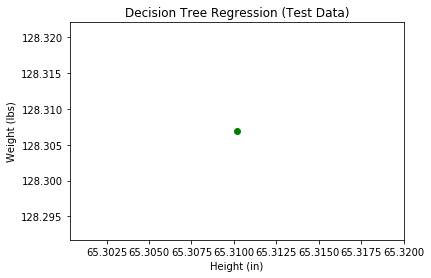

MSE: 105.288383752


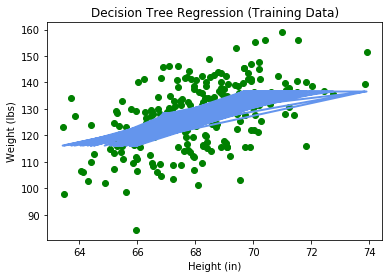

MSE: 105.288383752


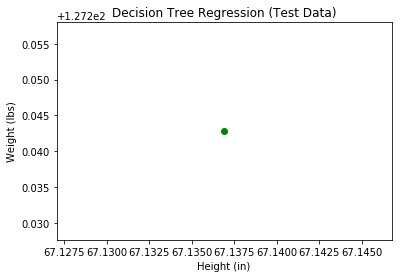

MSE: 104.601324898


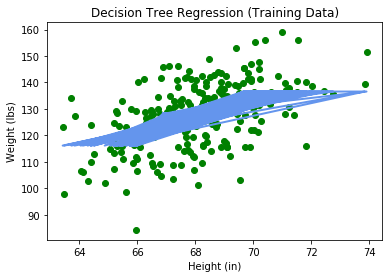

MSE: 104.601324898


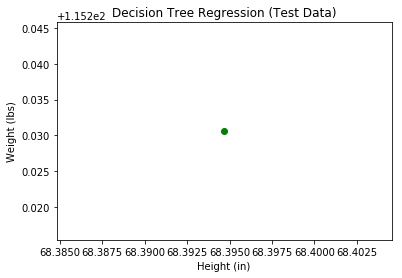

MSE: 105.275329369


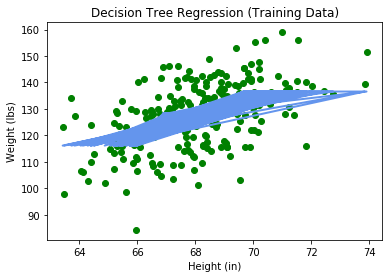

MSE: 105.275329369


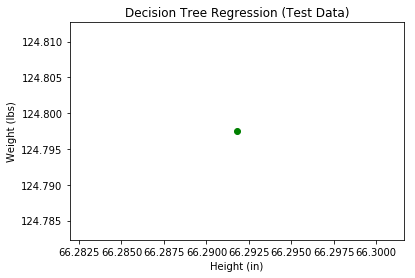

MSE: 105.285597304


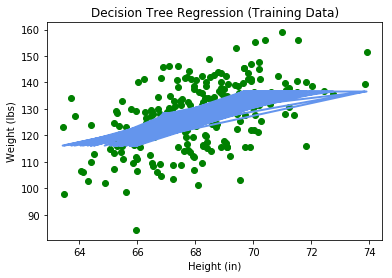

MSE: 105.285597304


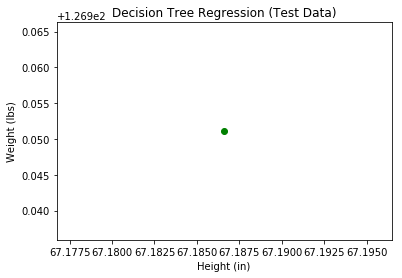

MSE: 105.087892946


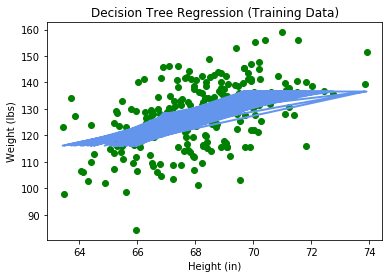

MSE: 105.087892946


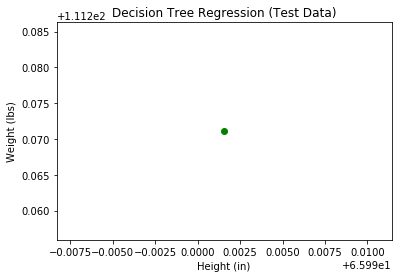

MSE: 105.162324689


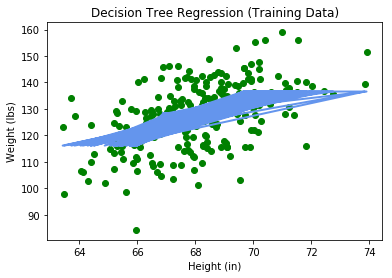

MSE: 105.162324689


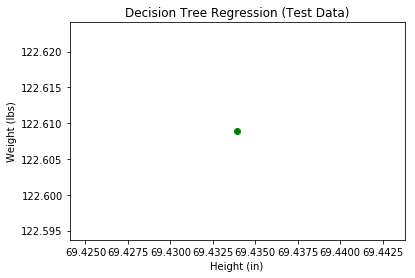

MSE: 105.225566719


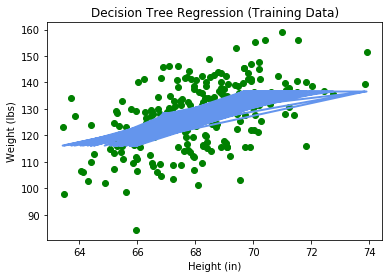

MSE: 105.225566719


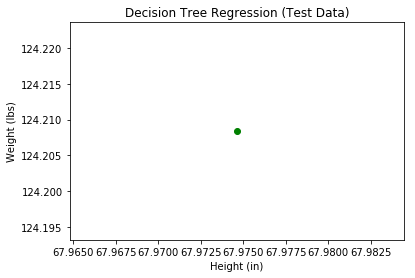

MSE: 105.239224464


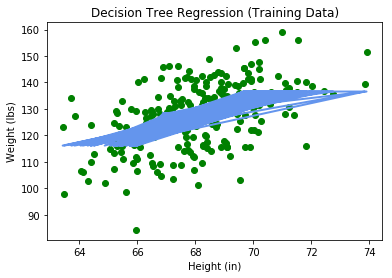

MSE: 105.239224464


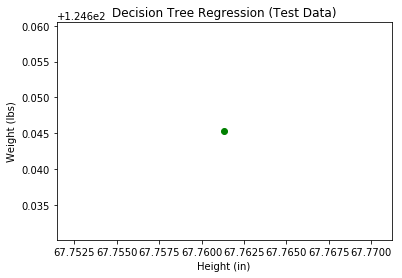

MSE: 105.246862145


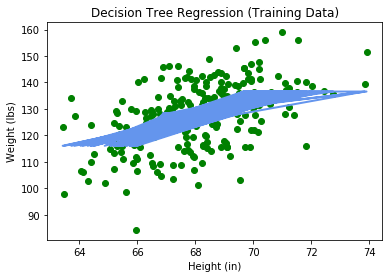

MSE: 105.246862145


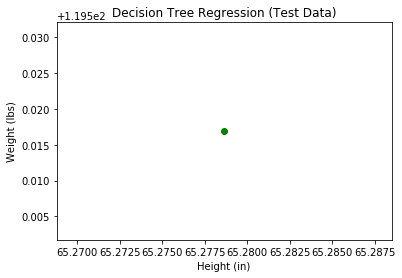

MSE: 105.262403437


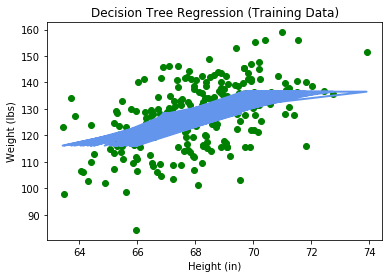

MSE: 105.262403437


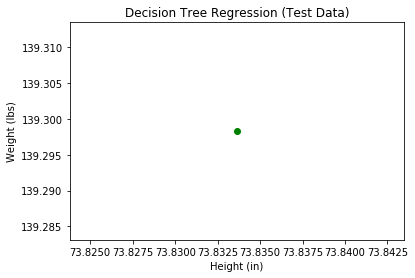

MSE: 103.282708486


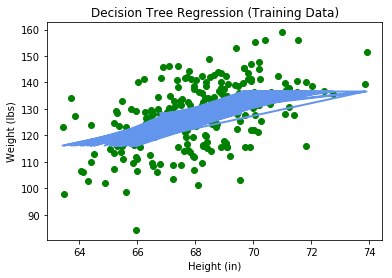

MSE: 103.282708486


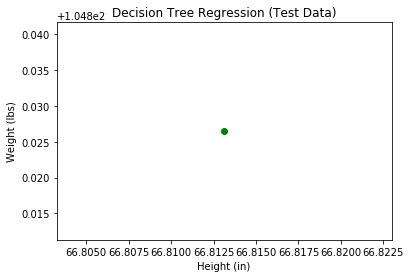

MSE: 105.181519402


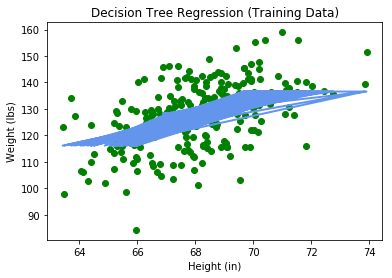

MSE: 105.181519402


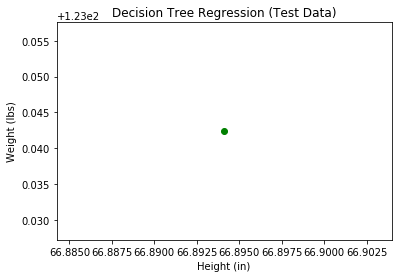

MSE: 105.262433653


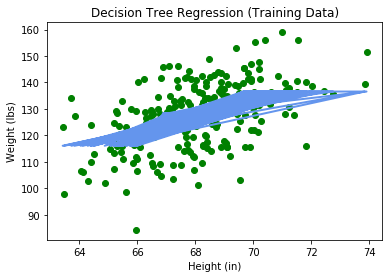

MSE: 105.262433653


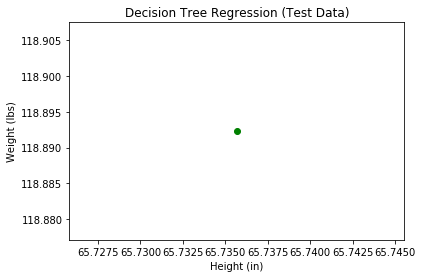

MSE: 105.176341644


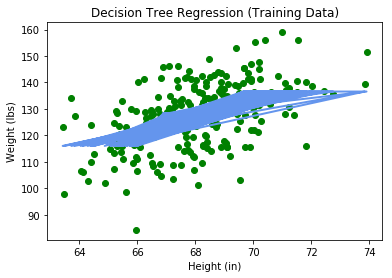

MSE: 105.176341644


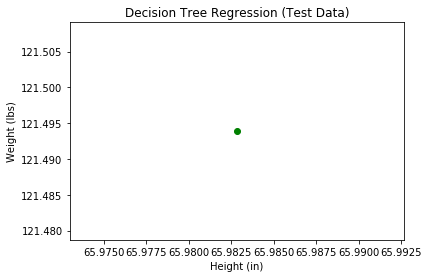

MSE: 105.24133633


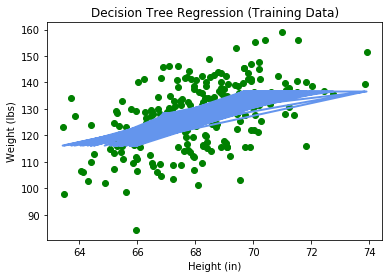

MSE: 105.24133633


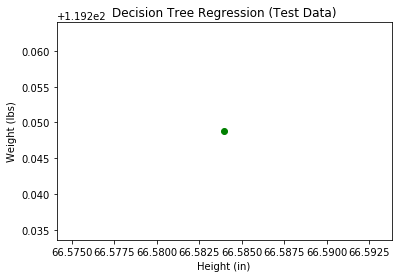

MSE: 105.107365685


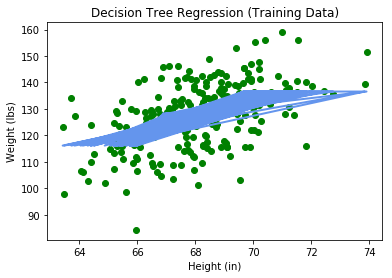

MSE: 105.107365685


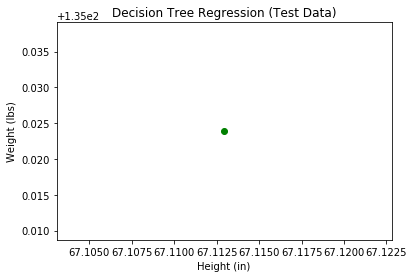

MSE: 105.292681239


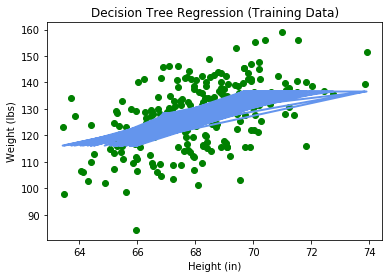

MSE: 105.292681239


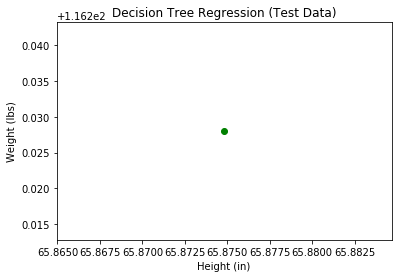

MSE: 104.382662007


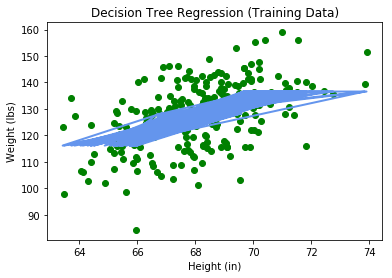

MSE: 104.382662007


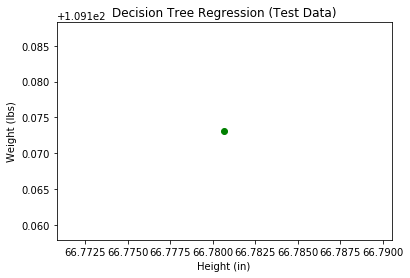

MSE: 105.226071227


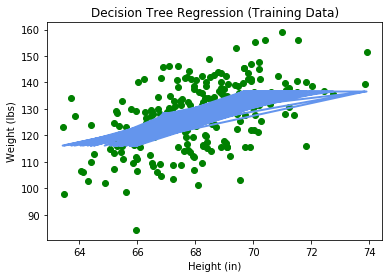

MSE: 105.226071227


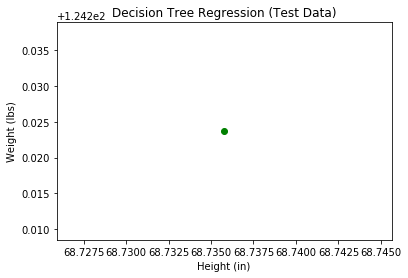

MSE: 103.879376743


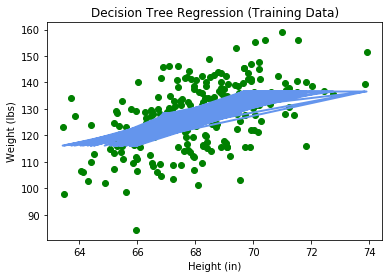

MSE: 103.879376743


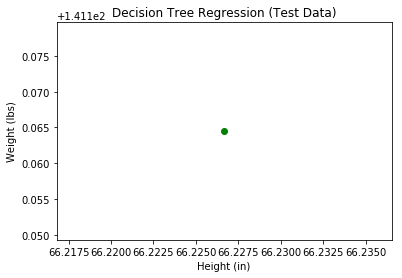

MSE: 104.598766677


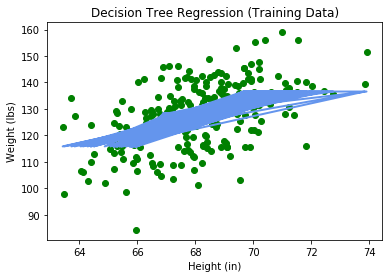

MSE: 104.598766677


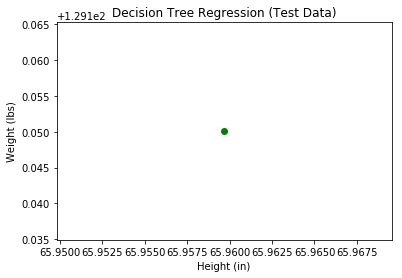

MSE: 105.292029936


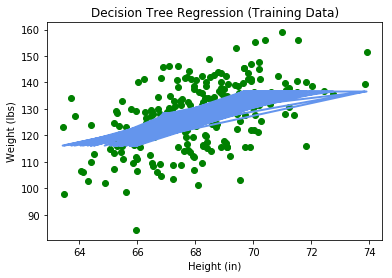

MSE: 105.292029936


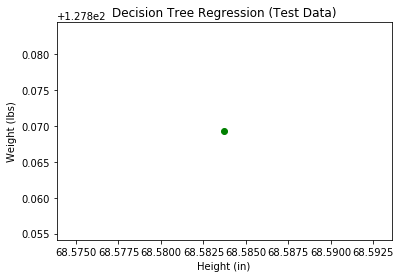

MSE: 105.278672341


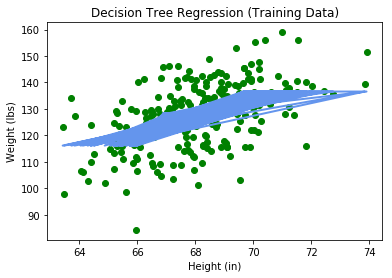

MSE: 105.278672341


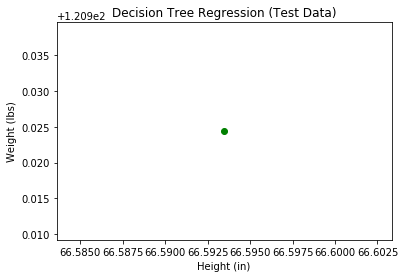

MSE: 105.291099392


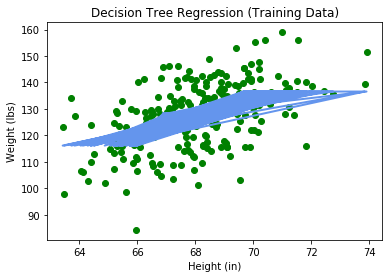

MSE: 105.291099392


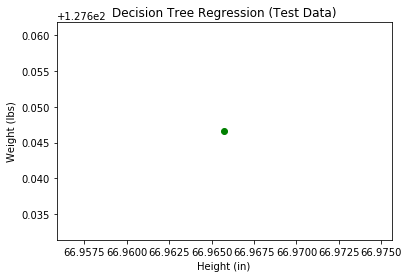

MSE: 102.372447323


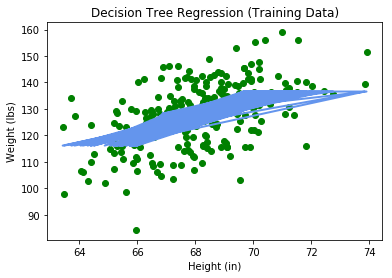

MSE: 102.372447323


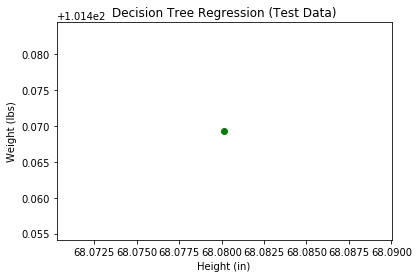

MSE: 105.002006557


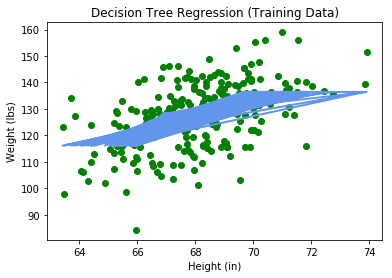

MSE: 105.002006557


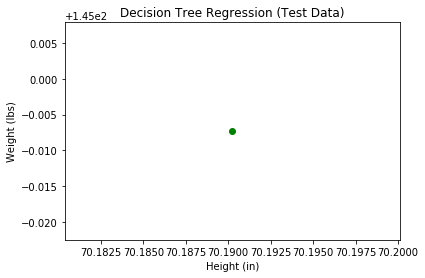

MSE: 105.179646743


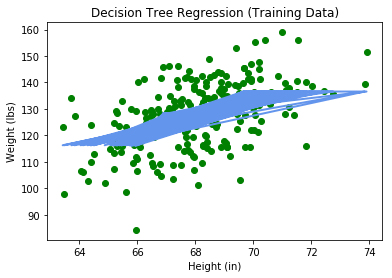

MSE: 105.179646743


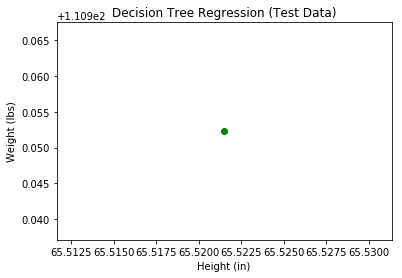

MSE: 105.207023783


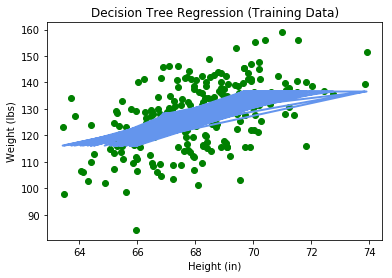

MSE: 105.207023783


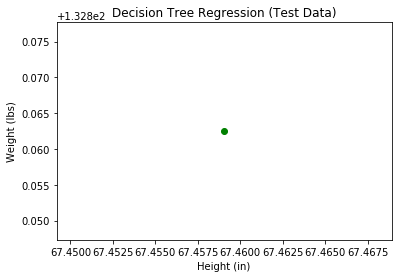

MSE: 103.222202075


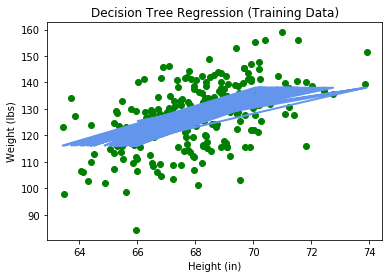

MSE: 103.222202075


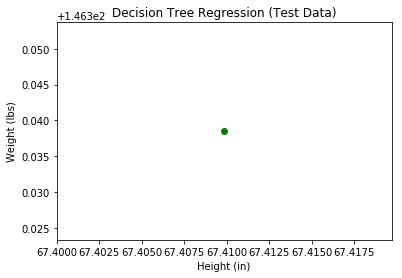

MSE: 104.86968979


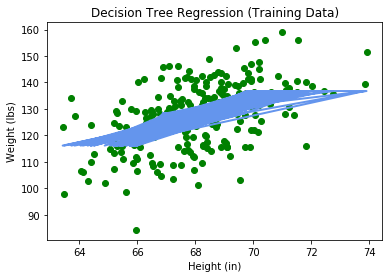

MSE: 104.86968979


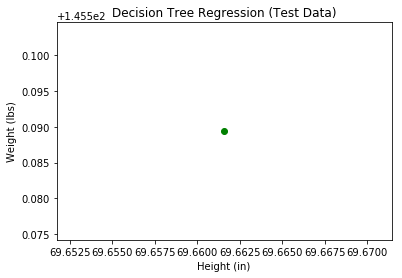

MSE: 105.203119047


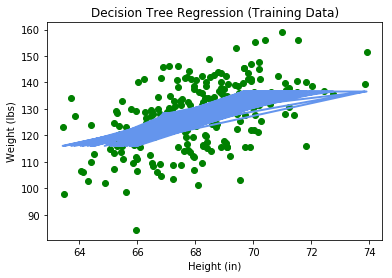

MSE: 105.203119047


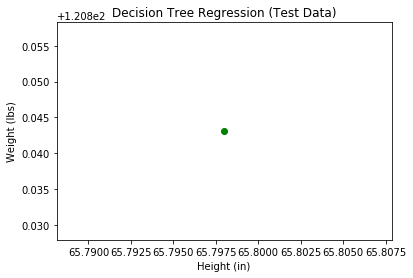

MSE: 105.089683154


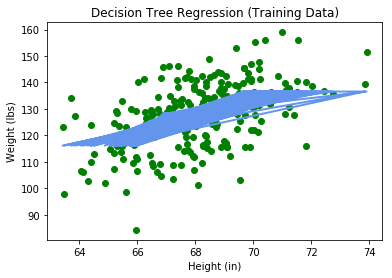

MSE: 105.089683154


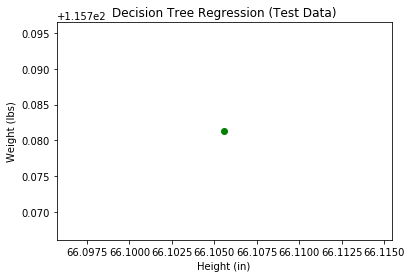

MSE: 105.292685169


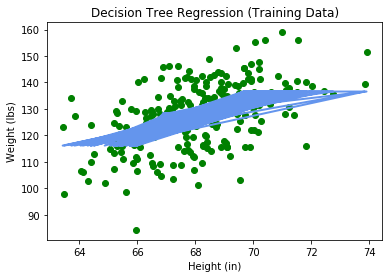

MSE: 105.292685169


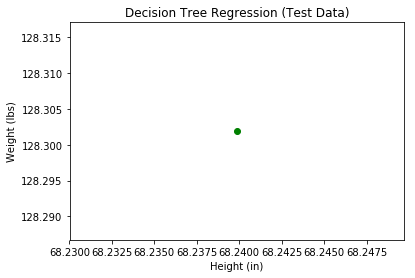

MSE: 105.290086546


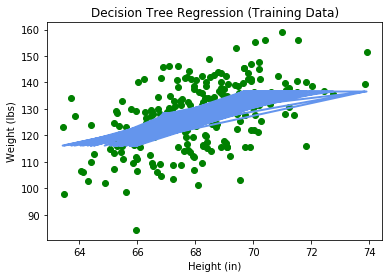

MSE: 105.290086546


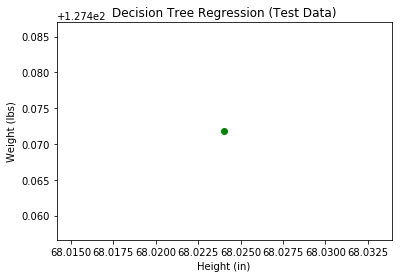

MSE: 104.98092315


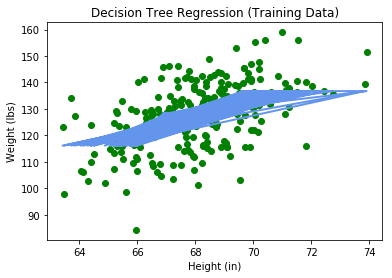

MSE: 104.98092315


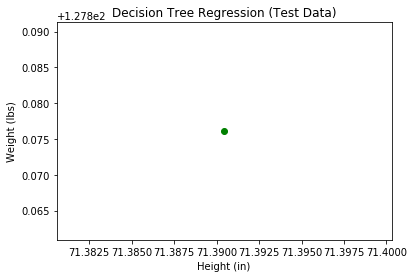

MSE: 105.176087279


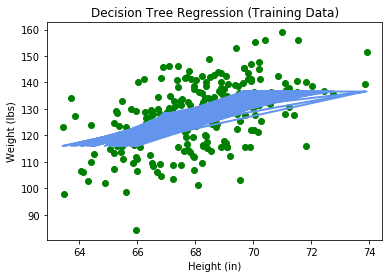

MSE: 105.176087279


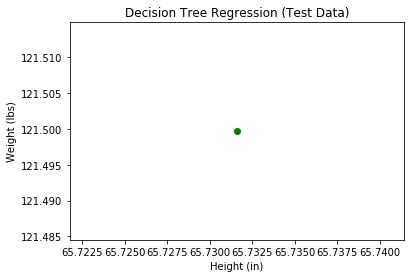

MSE: 104.871989624


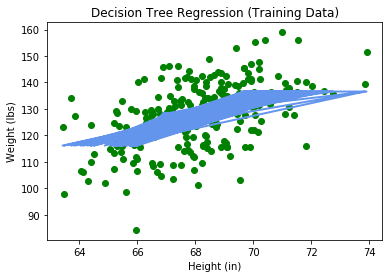

MSE: 104.871989624


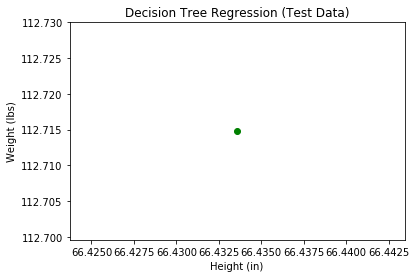

MSE: 105.282396722


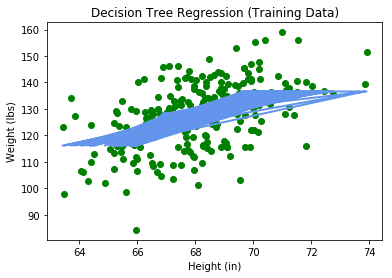

MSE: 105.282396722


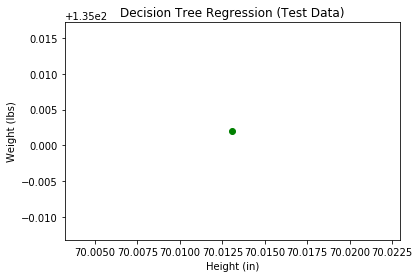

MSE: 105.29201546


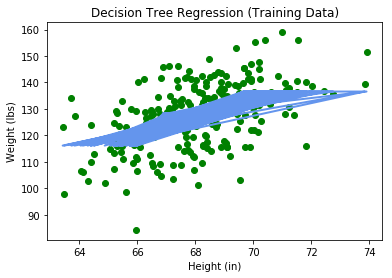

MSE: 105.29201546


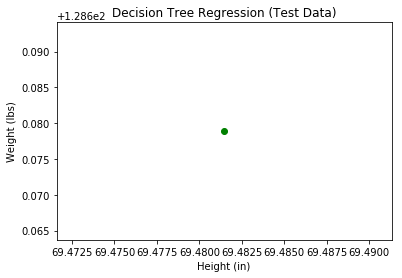

MSE: 105.231942312


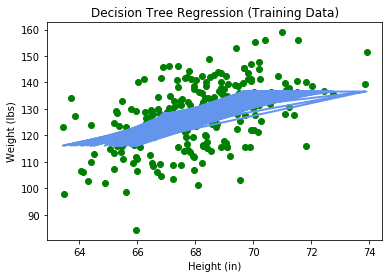

MSE: 105.231942312


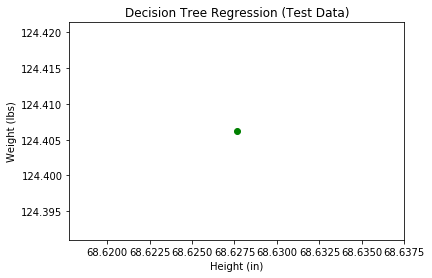

MSE: 104.731067495


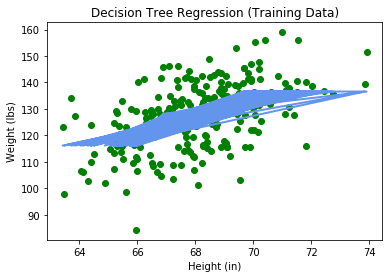

MSE: 104.731067495


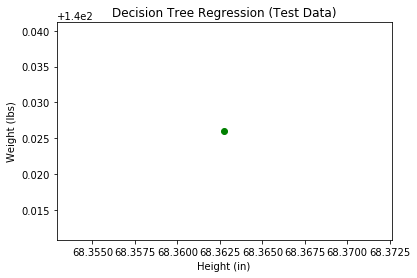

MSE: 104.822669007


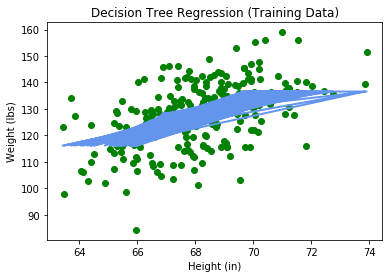

MSE: 104.822669007


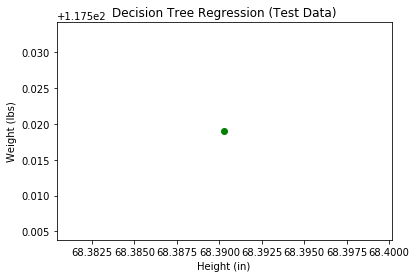

MSE: 104.303192331


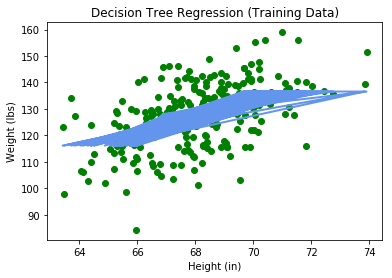

MSE: 104.303192331


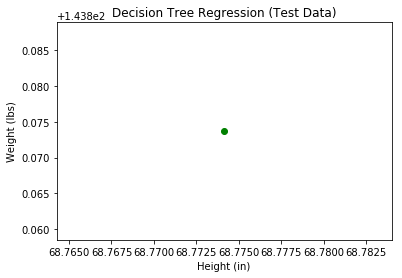

MSE: 105.206218217


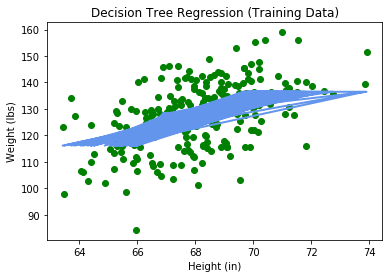

MSE: 105.206218217


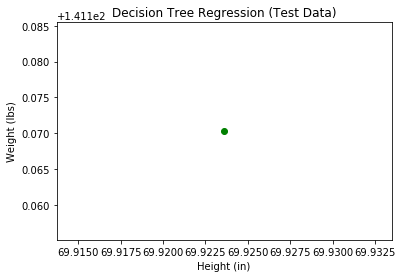

MSE: 103.752171594


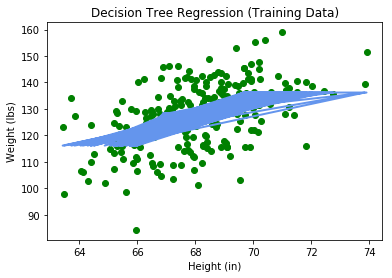

MSE: 103.752171594


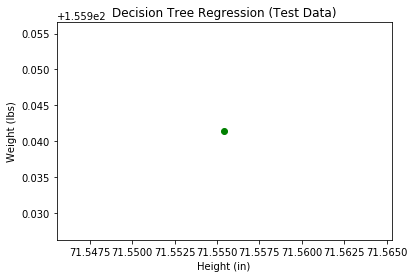

MSE: 105.158876838


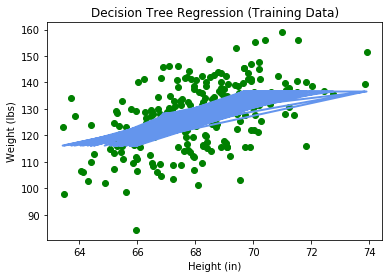

MSE: 105.158876838


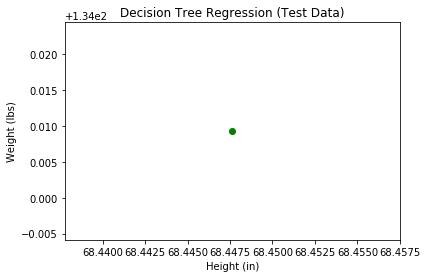

MSE: 105.067956847


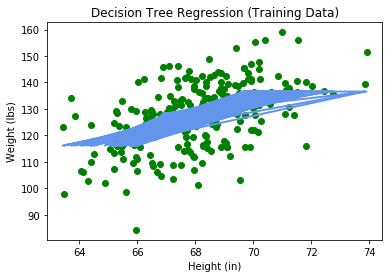

MSE: 105.067956847


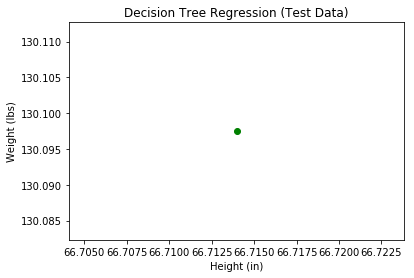

MSE: 104.152782138


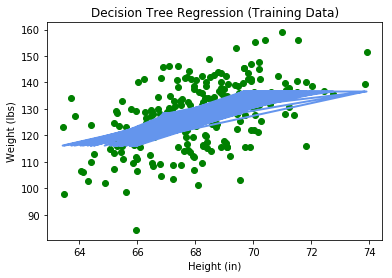

MSE: 104.152782138


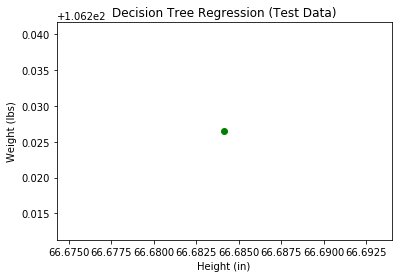

MSE: 104.222828034


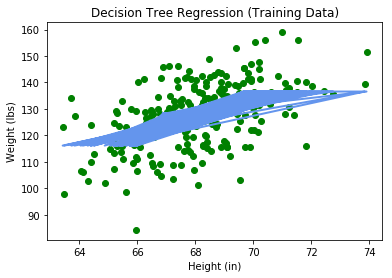

MSE: 104.222828034


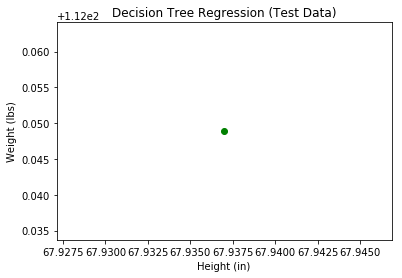

MSE: 105.03792883


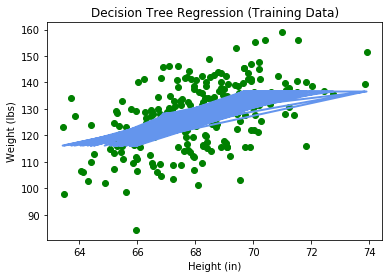

MSE: 105.03792883


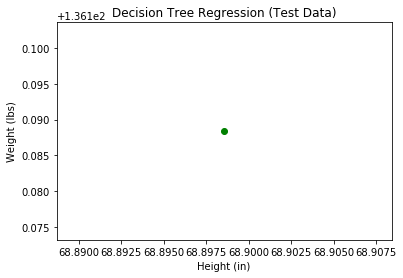

MSE: 105.256973852


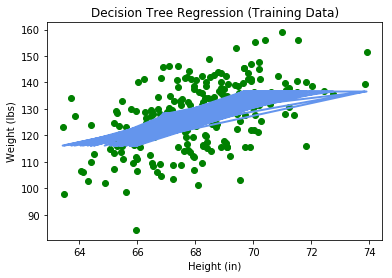

MSE: 105.256973852


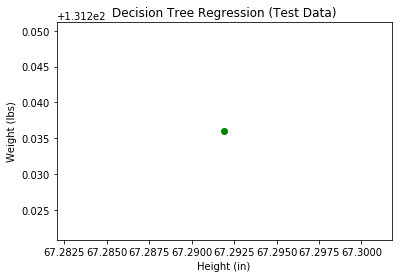

MSE: 105.254844045


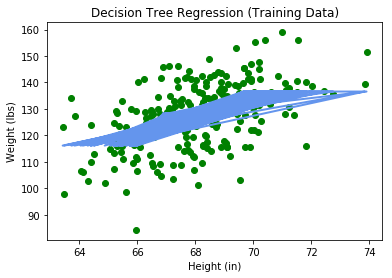

MSE: 105.254844045


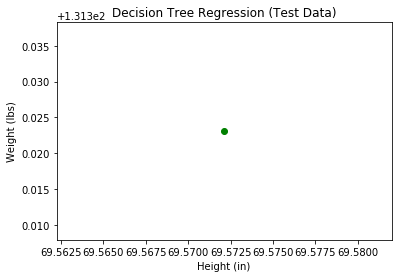

MSE: 104.981757804


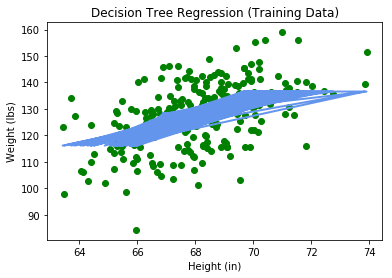

MSE: 104.981757804


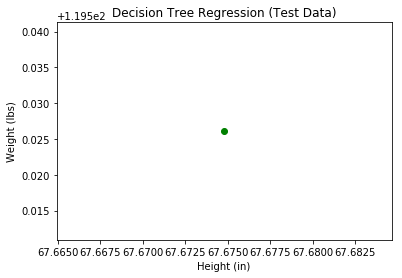

MSE: 104.775881253


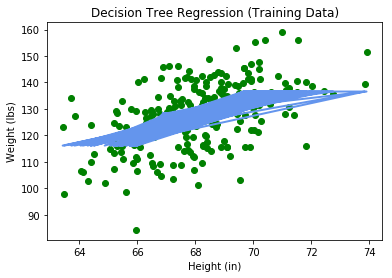

MSE: 104.775881253


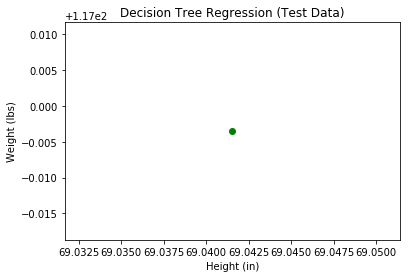

MSE: 104.865305509


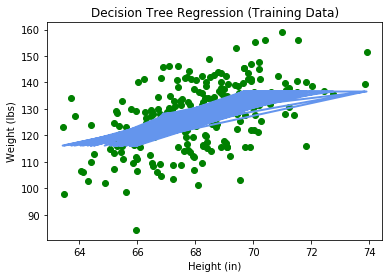

MSE: 104.865305509


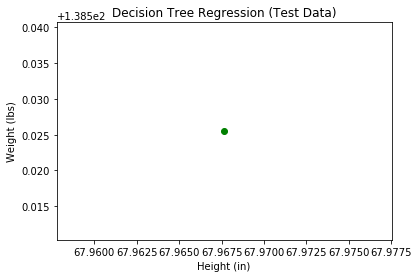

MSE: 105.116476531


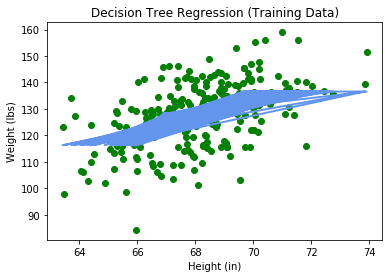

MSE: 105.116476531


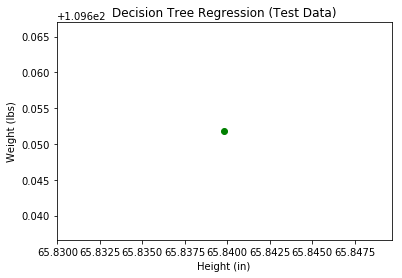

MSE: 104.486808495


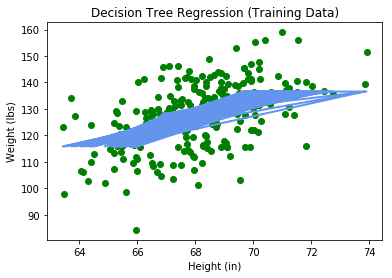

MSE: 104.486808495


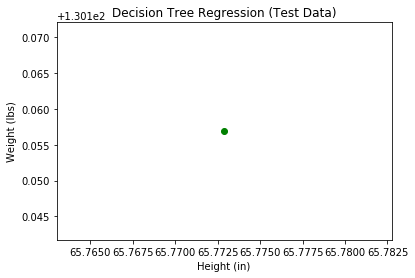

MSE: 105.291546127


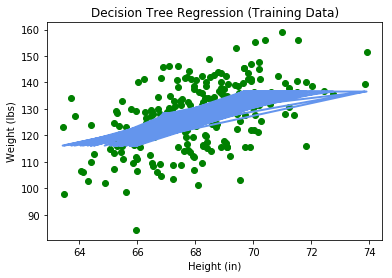

MSE: 105.291546127


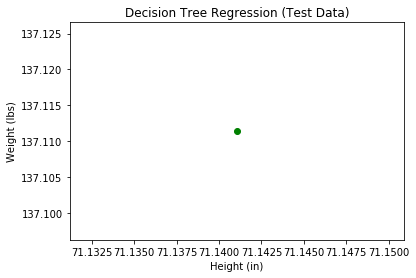

MSE: 104.436492527


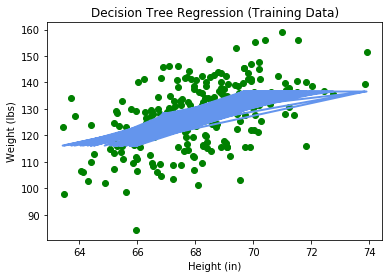

MSE: 104.436492527


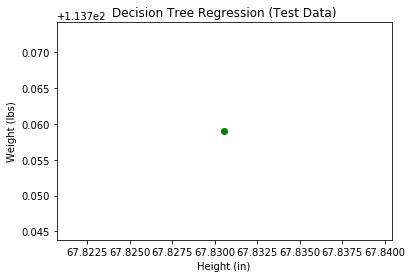

MSE: 105.286618368


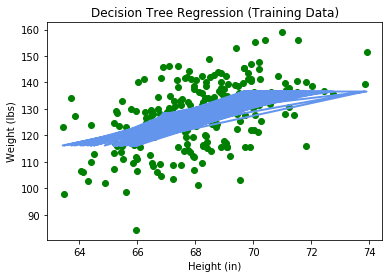

MSE: 105.286618368


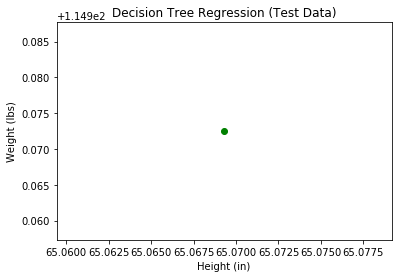

MSE: 104.969273814


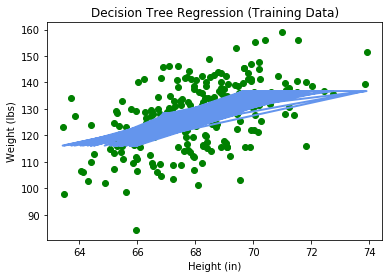

MSE: 104.969273814


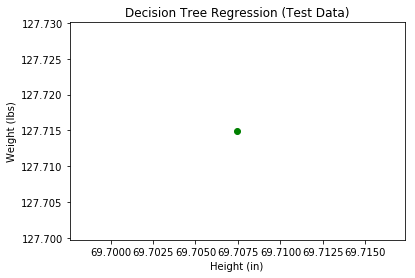

MSE: 104.417879404


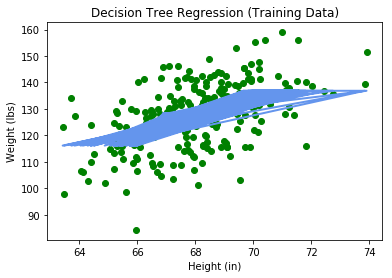

MSE: 104.417879404


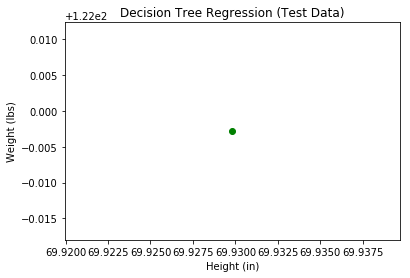

MSE: 105.196710542


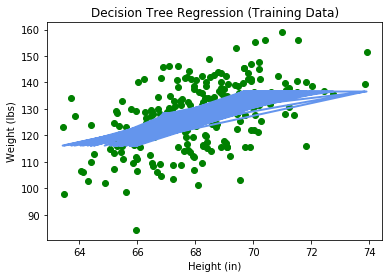

MSE: 105.196710542


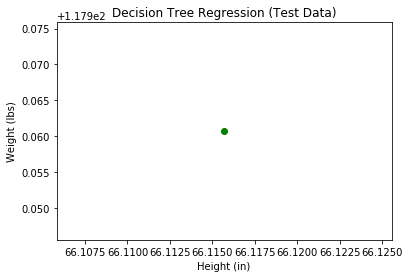

MSE: 105.291424024


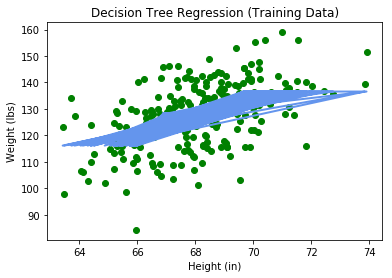

MSE: 105.291424024


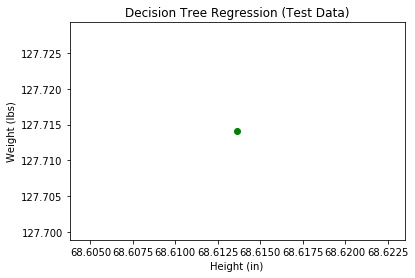

MSE: 104.860590792


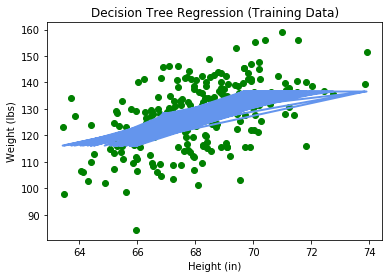

MSE: 104.860590792


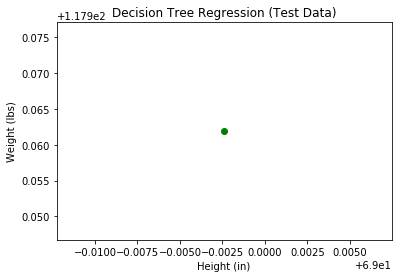

MSE: 105.268703959


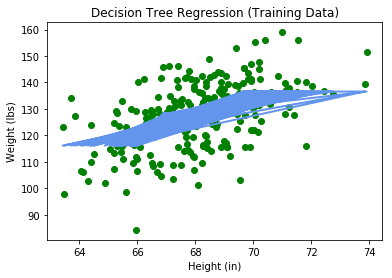

MSE: 105.268703959


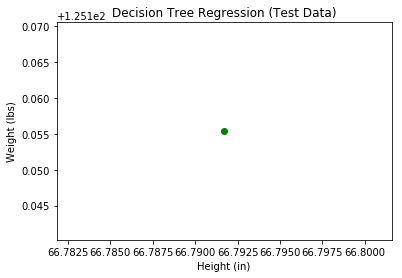

MSE: 104.623474023


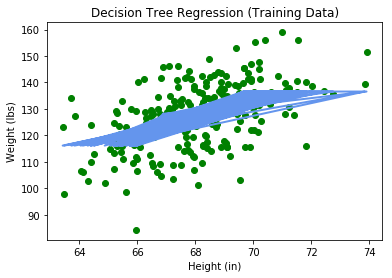

MSE: 104.623474023


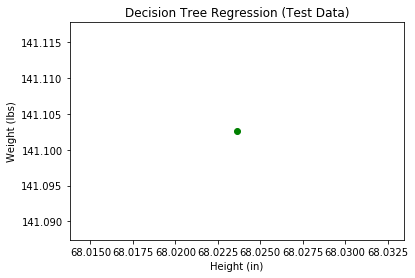

MSE: 104.884510309


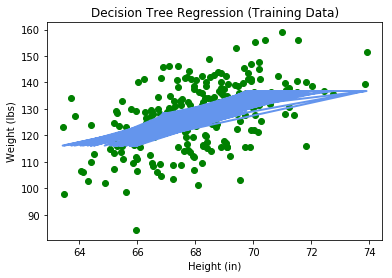

MSE: 104.884510309


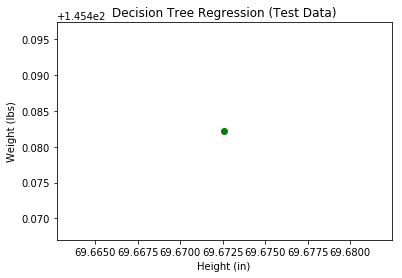

MSE: 103.561667831


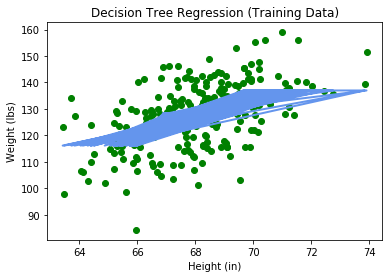

MSE: 103.561667831


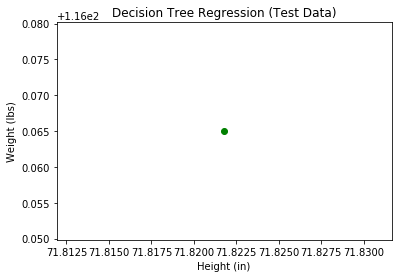

MSE: 105.289798919


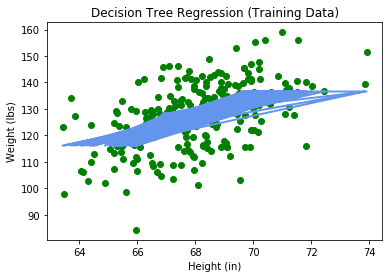

MSE: 105.289798919


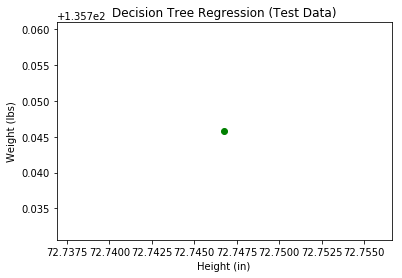

MSE: 105.204682848


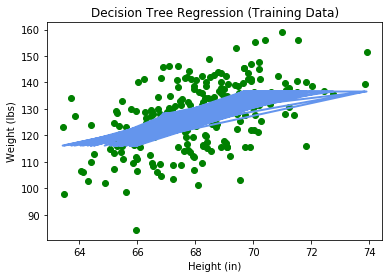

MSE: 105.204682848


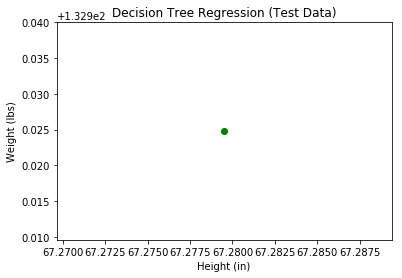

MSE: 104.64632885


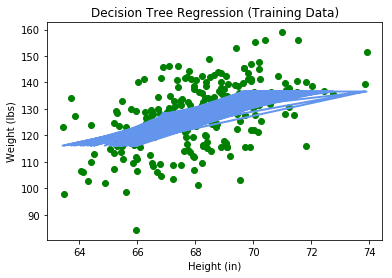

MSE: 104.64632885


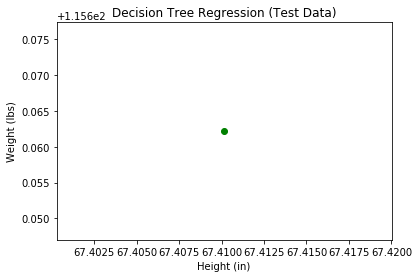

MSE: 104.501224662


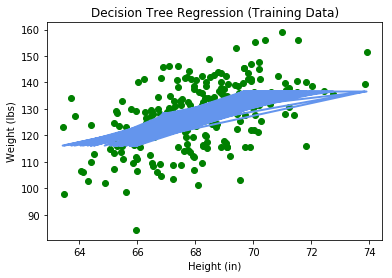

MSE: 104.501224662


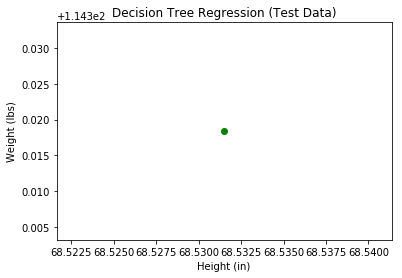

MSE: 103.554207109


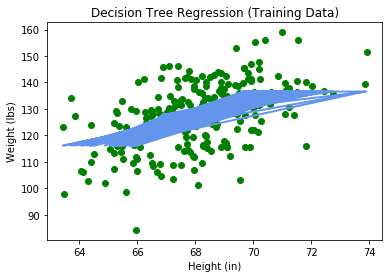

MSE: 103.554207109


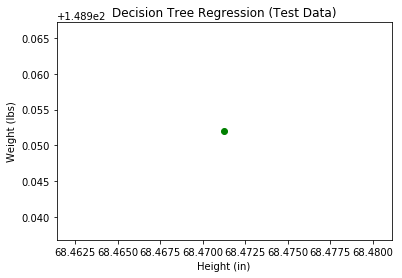

MSE: 104.505484558


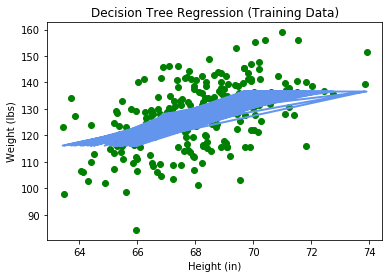

MSE: 104.505484558


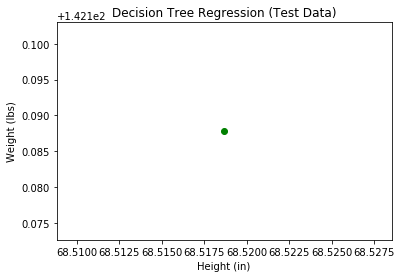

MSE: 103.967160874


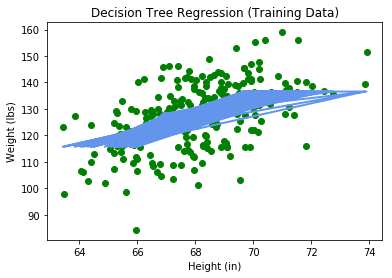

MSE: 103.967160874


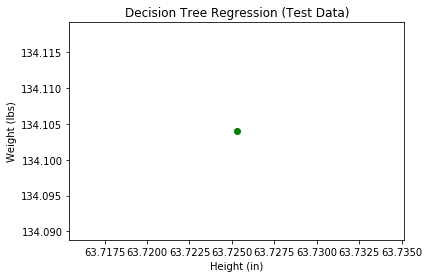

MSE: 104.538528476


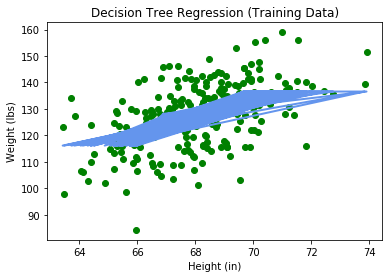

MSE: 104.538528476


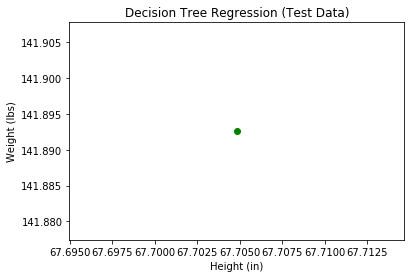

MSE: 104.846862651


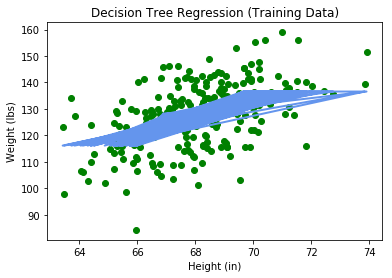

MSE: 104.846862651


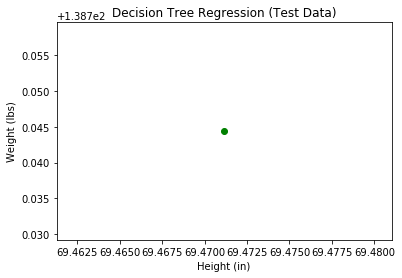

MSE: 104.722507768


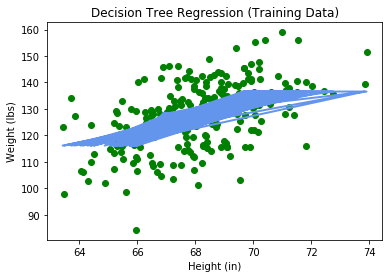

MSE: 104.722507768


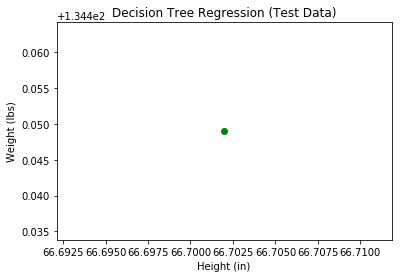

MSE: 105.289834073


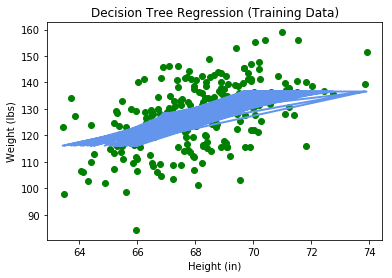

MSE: 105.289834073


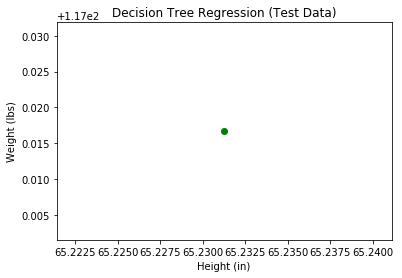

MSE: 103.495275275


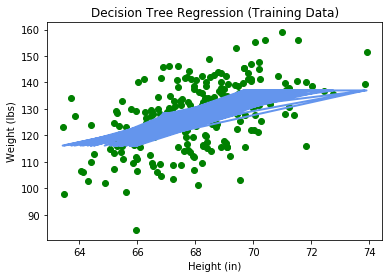

MSE: 103.495275275


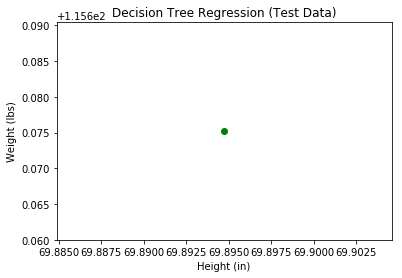

MSE: 105.279461226


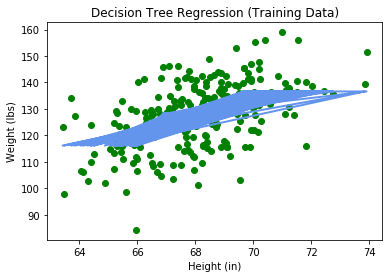

MSE: 105.279461226


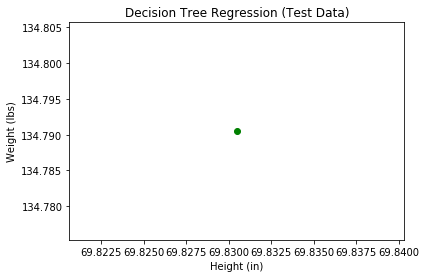

MSE: 105.21314759


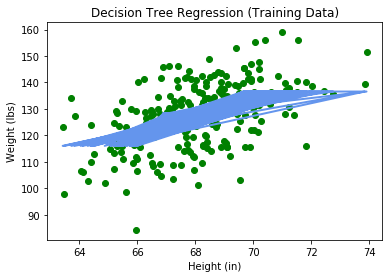

MSE: 105.21314759


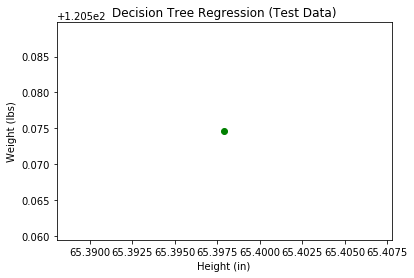

MSE: 105.020128227


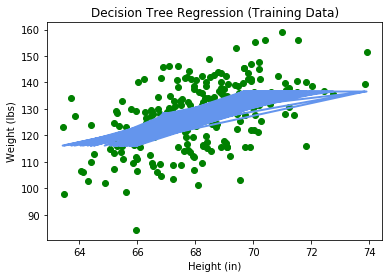

MSE: 105.020128227


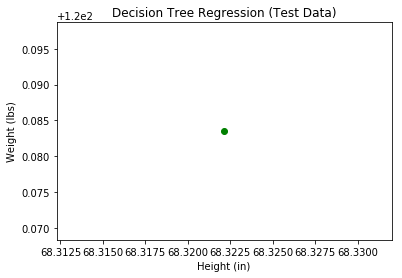

MSE: 100.7807083


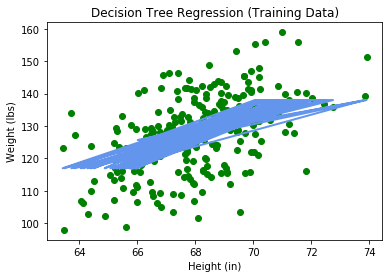

MSE: 100.7807083


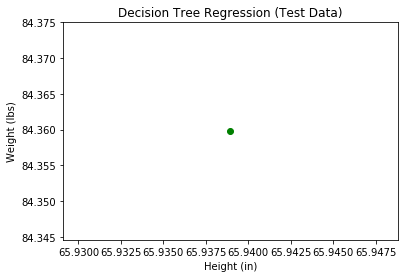

Average Training-MSE: 105.269812063
Average Test-MSE: 0.0


In [3]:
#Leave One Out Cross Validation
from sklearn.model_selection import LeaveOneOut
#load data
data=pd.read_excel('Book.xlsx')
mat1=data.as_matrix()
data=np.transpose(data.as_matrix())

#plot the data
x=data[1]
y=data[2]
loo = LeaveOneOut()
loo.get_n_splits(x)
sum1=0
sum2=0
for train_index, test_index in loo.split(x):
    #print("TRAIN:", train_index, "TEST:", test_index)
    x_train, x_test = x[train_index], x[test_index]
    y_train, y_test = y[train_index], y[test_index]
    #print(x_train, x_test, y_train, y_test)
    

#plot the data
    c=x_train.reshape(-1,1)
    d=y_train
    tree_reg=DecisionTreeRegressor(max_depth=2)
    tree_reg.fit(c,d)
    tree_mse=mean_squared_error(d,tree_reg.predict(c))
    d_1 = tree_reg.fit(c,d).predict(c)
    print("MSE:",tree_mse)
    #plt.figure()
    plt.scatter(c, d, c='green')
    plt.plot(c, d_1, color="cornflowerblue", linewidth=2)
    plt.xlabel("Height (in)")
    plt.ylabel("Weight (lbs)")
    plt.title('Decision Tree Regression (Training Data)')
    plt.legend()
    plt.show()
    sum1+= tree_mse

#plot the data
    a=x_test.reshape(-1,1)
    b=y_test
    tree_reg=DecisionTreeRegressor(max_depth=2)
    tree_reg.fit(a,b)
    tree1_mse=mean_squared_error(b,tree_reg.predict(a))
    b_1 = tree_reg.fit(a,b).predict(a)
    print("MSE:",tree_mse)
    plt.figure()
    plt.scatter(a, b, c='green')
    plt.plot(a, b_1, color="cornflowerblue", linewidth=2)
    plt.xlabel("Height (in)")
    plt.ylabel("Weight (lbs)")
    plt.title('Decision Tree Regression (Test Data)')
    plt.legend()
    sum2+= tree1_mse
    
    plt.show()
print("Average Training-MSE:",sum1/len(y_train))
print("Average Test-MSE:",sum2/len(y_test))